# Мартьянова Александра Евгеньевна, курс «Data Science», ВКР

### Кластеризация параметров

#### 1. Загрузка и подготовка датасета

In [1]:
# Загрузка разных библиотек
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering 
from scipy.cluster import hierarchy 
from scipy.spatial import distance_matrix 
from sklearn.metrics import silhouette_score
from fcmeans import FCM
import scipy.stats as stats
import statistics
from scipy.stats import f_oneway

%matplotlib inline 

In [2]:
# Загрузка в объект DataFrame файла X_bp.xlsx, метод read_excel
x_bp = pd.read_excel('X_bp.xlsx', index_col = 0)
x_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [3]:
# Загрузка в объект DataFrame файла X_nup.xlsx, метод read_excel
x_nup = pd.read_excel('X_nup.xlsx', index_col = 0)
x_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.0,57.0
1.0,0.0,4.0,60.0
2.0,0.0,4.0,70.0
3.0,0.0,5.0,47.0
4.0,0.0,5.0,57.0


In [4]:
# соединение объектов DataFrame, метод merge, объединение по индексу, тип объединения INNER
df = x_bp.merge(x_nup, how = 'inner', left_index = True, right_index = True)
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [5]:
# Изменение типа данных индекса, метод astype('int')
df.index = df.index.astype('int')
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [6]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df.dtypes['Угол нашивки, град']

dtype('float64')

In [7]:
# Изменение типа данных и ранжировка переменной 'Угол нашивки, град', метод astype('int')
df = df.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
df['Угол нашивки, град'] = df['Угол нашивки, град'].astype(int)

In [8]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df.dtypes['Угол нашивки, град']

dtype('int32')

In [9]:
# Описательная статистика датасета df, метод describe()
df.describe(include='all')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901


In [10]:
# Вывод сведений о новом объекте DataFrame df_s, метод info()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int32  
 11  Шаг нашивки      

In [11]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [12]:
# Заменить названия столбцов таблицы методом set_axis()
df = df.set_axis(['МатрНап','Плотн','МодУпр','КолвОтвер','КолвЭпокс','ТемпВсп','ПовПлотн','МодУпрРаст','ПрочнРаст','КолвСмол','УголНаш','ШагНаш','ПлотнНаш'], axis = 'columns') 
df.head()

,МатрНап,Плотн,МодУпр,КолвОтвер,КолвЭпокс,ТемпВсп,ПовПлотн,МодУпрРаст,ПрочнРаст,КолвСмол,УголНаш,ШагНаш,ПлотнНаш
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [13]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

In [14]:
# копия датасета
df_s = df.copy()

In [15]:
# относительное удлинение при растяжении
df['ДелРаст'] = df['ПрочнРаст'] / df['МодУпрРаст']

In [16]:
# относительное удлиненее
df['Дел'] = df['ПрочнРаст'] / df['МодУпр']

In [17]:
df.head(30)

,МатрНап,Плотн,МодУпр,КолвОтвер,КолвЭпокс,ТемпВсп,ПовПлотн,МодУпрРаст,ПрочнРаст,КолвСмол,УголНаш,ШагНаш,ПлотнНаш,ДелРаст,Дел
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.0,57.0,42.857143,4.060986
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.0,60.0,42.857143,4.060986
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.0,70.0,42.857143,4.060986
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.0,47.0,42.857143,4.060986
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.0,57.0,42.857143,3.984064
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.0,60.0,42.857143,4.010695
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.0,70.0,42.857143,3.717472
7,2.561475,1900.000000,535.000000,111.860000,22.267857,284.615385,380.000000,75.000000,1800.000000,120.000000,0,7.0,47.0,24.000000,3.364486
8,3.557018,1930.000000,889.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0,7.0,57.0,24.000000,2.024747
9,3.532338,2100.000000,1421.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0,7.0,60.0,25.641026,1.407460


In [18]:
df['ДелРаст'].duplicated().sum(), df['Дел'].duplicated().sum(), df['ПрочнРаст'].duplicated().sum(), df['МодУпрРаст'].duplicated().sum()

(19, 3, 19, 19)

In [19]:
df['ДелРаст'].nunique(), df['Дел'].nunique(), df['ПрочнРаст'].nunique(), df['МодУпрРаст'].nunique()

(1004, 1020, 1004, 1004)

#### 2. Нормализация датасета

In [20]:
# Загрузка MinMaxScaler из библиотеки sklearn.preprocessing
from sklearn.preprocessing import MinMaxScaler

In [21]:
# Применение MinMaxScaler для нормализации датасета df
min_max_scaler = MinMaxScaler()
df = pd.DataFrame(min_max_scaler.fit_transform(df), columns = df.columns, index=df.index)

In [22]:
# Описательная статистика нормализованного датасета df
df.describe()

,МатрНап,Плотн,МодУпр,КолвОтвер,КолвЭпокс,ТемпВсп,ПовПлотн,МодУпрРаст,ПрочнРаст,КолвСмол,УголНаш,ШагНаш,ПлотнНаш,ДелРаст,Дел
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,0.488427,0.512533,0.386301,0.512273,0.426215,0.593354,0.344638,0.497880,0.508634,0.484838,0.491691,0.477768,0.549616,0.487678,0.006007
std,0.175541,0.154890,0.172978,0.156147,0.128370,0.130695,0.201092,0.167435,0.172724,0.156875,0.500175,0.177519,0.118772,0.160786,0.037767
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.370696,0.404175,0.260652,0.412240,0.338919,0.507756,0.190296,0.386030,0.390881,0.382955,0.000000,0.351790,0.478890,0.378153,0.001472
50%,0.483912,0.516497,0.386165,0.512240,0.425487,0.593401,0.322574,0.494672,0.506003,0.486875,0.000000,0.478940,0.551423,0.485273,0.002328
75%,0.608045,0.608413,0.502528,0.618003,0.517842,0.679924,0.495105,0.606751,0.615432,0.587411,1.000000,0.594597,0.624537,0.589120,0.003666
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Прочность при растяжении, МПа

###### 15. Исключить из параметров: ничего

In [23]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш', 'ДелРаст', 'Дел'],
      dtype='object')

In [24]:
# Назначение переменной X
X = df.drop(['УголНаш','Дел'], axis=1)

###### K-Means

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


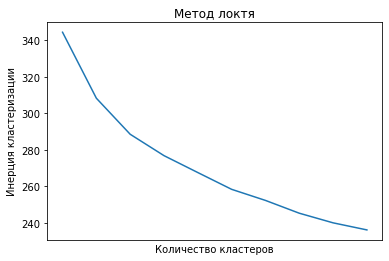

In [25]:
# Метод локтя
n_inertia = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X)
    n_inertia.append(km.inertia_)
    
fig, ax = plt.subplots()
sns.lineplot(x=np.arange(1, 11), y=n_inertia, ax=ax)
ax.set_title('Метод локтя')
ax.set_xlabel('Количество кластеров')
ax.set_ylabel('Инерция кластеризации')
plt.xticks(np.arange(1, 1))
plt.show()
# ax.set_title('Метод локтя')
# ax.set_xlabel('Количество кластеров')
# ax.set_ylabel('Качество кластеризации')

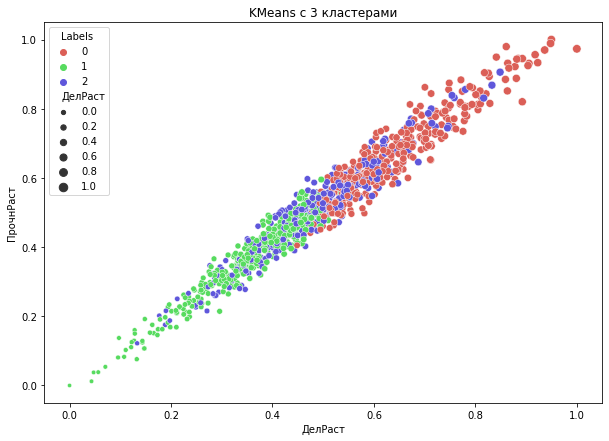

In [26]:
# KMeans показывает кластеризацию параметров
fig = plt.figure(figsize=(10,7))
km5 = KMeans(n_clusters=3).fit(X)
X['Labels'] = km5.labels_

sns.scatterplot(x=X['ДелРаст'], y=X['ПрочнРаст'], hue=X['Labels'], size=X['ДелРаст'], palette=sns.color_palette('hls', 3))

plt.title('KMeans c 3 кластерами')
plt.show()

In [27]:
# количество данных в кластерах
X[X['Labels']==0].count(),X[X['Labels']==1].count(),X[X['Labels']==2].count(),X[X['Labels']==3].count(),X[X['Labels']==4].count()

(МатрНап       359
 Плотн         359
 МодУпр        359
 КолвОтвер     359
 КолвЭпокс     359
 ТемпВсп       359
 ПовПлотн      359
 МодУпрРаст    359
 ПрочнРаст     359
 КолвСмол      359
 ШагНаш        359
 ПлотнНаш      359
 ДелРаст       359
 Labels        359
 dtype: int64,
 МатрНап       353
 Плотн         353
 МодУпр        353
 КолвОтвер     353
 КолвЭпокс     353
 ТемпВсп       353
 ПовПлотн      353
 МодУпрРаст    353
 ПрочнРаст     353
 КолвСмол      353
 ШагНаш        353
 ПлотнНаш      353
 ДелРаст       353
 Labels        353
 dtype: int64,
 МатрНап       311
 Плотн         311
 МодУпр        311
 КолвОтвер     311
 КолвЭпокс     311
 ТемпВсп       311
 ПовПлотн      311
 МодУпрРаст    311
 ПрочнРаст     311
 КолвСмол      311
 ШагНаш        311
 ПлотнНаш      311
 ДелРаст       311
 Labels        311
 dtype: int64,
 МатрНап       0
 Плотн         0
 МодУпр        0
 КолвОтвер     0
 КолвЭпокс     0
 ТемпВсп       0
 ПовПлотн      0
 МодУпрРаст    0
 ПрочнРаст     0
 Кол

In [28]:
# данные в кластерах по параметру 'ПрочнРаст'
X[X['Labels']==0]['ПрочнРаст'].head(20),X[X['Labels']==1]['ПрочнРаст'].head(20),X[X['Labels']==2]['ПрочнРаст'].head(20)

(0     0.698235
 1     0.698235
 2     0.698235
 3     0.698235
 4     0.698235
 5     0.698235
 6     0.698235
 15    0.698235
 16    0.698235
 24    0.949223
 27    0.719231
 32    0.507099
 34    0.729017
 35    0.765150
 38    0.605842
 41    0.651495
 46    0.843247
 47    0.529936
 52    0.497733
 53    0.542289
 Name: ПрочнРаст, dtype: float64,
 7     0.271429
 8     0.271429
 13    0.504591
 14    0.504591
 17    0.271429
 18    0.271429
 22    0.504591
 26    0.510862
 33    0.450606
 36    0.303619
 37    0.124386
 42    0.421020
 45    0.214490
 48    0.506003
 50    0.348433
 51    0.377301
 54    0.456669
 59    0.343290
 60    0.394141
 61    0.522293
 Name: ПрочнРаст, dtype: float64,
 9     0.342563
 10    0.342563
 11    0.342563
 12    0.504591
 19    0.342563
 20    0.342563
 21    0.504591
 23    0.551464
 25    0.564512
 28    0.445341
 29    0.593114
 30    0.502239
 31    0.625957
 39    0.541612
 40    0.644347
 43    0.461906
 44    0.436028
 49    0.269906
 71 

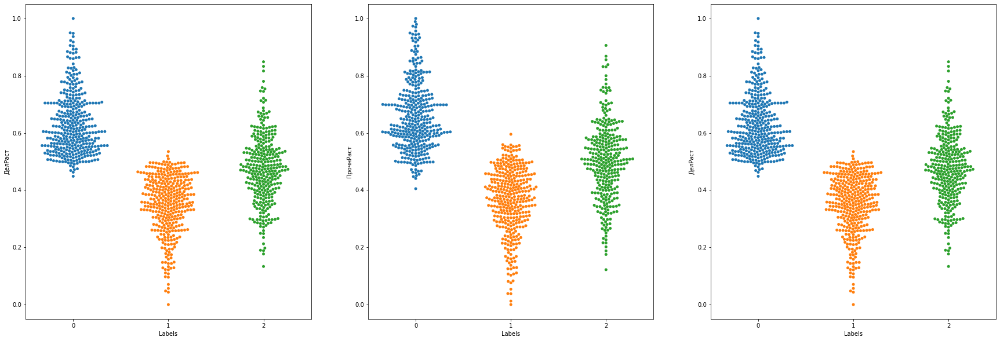

In [29]:
# swarmplot показывает распределение и разброс параметров по кластерам
fig = plt.figure(figsize=(30,10))
ax = fig.add_subplot(131)
sns.swarmplot(x='Labels', y='ДелРаст', data=X, ax=ax)

ax = fig.add_subplot(132)
sns.swarmplot(x='Labels', y='ПрочнРаст', data=X, ax=ax)

ax = fig.add_subplot(133)
sns.swarmplot(x='Labels', y='ДелРаст', data=X, ax=ax)

plt.show()

In [30]:
# The Silhouette Coefficient is calculated using the mean intra-cluster distance and the mean nearest-cluster distance for each sample
print("Silhouette score: {}".format(silhouette_score(X.drop(['Labels'], axis=1), X.Labels)))

Silhouette score: 0.08479309431940792


Проверка значимости различия групп по критерию Краскала-Уоллиса

In [31]:
# индексация кластеров
filter_0 = X[X['Labels']==0].index
filter_1 = X[X['Labels']==1].index
filter_2 = X[X['Labels']==2].index
#filter_3 = X[X['Labels']==3].index

In [32]:
# выделение объектов np.array
df_0 = np.array(df_s['ПрочнРаст'][filter_0].reset_index(drop=True))
df_1 = np.array(df_s['ПрочнРаст'][filter_1].reset_index(drop=True))
df_2 = np.array(df_s['ПрочнРаст'][filter_2].reset_index(drop=True))
#df_3 = np.array(df_s['ПрочнРаст'][filter_3].reset_index(drop=True))

In [33]:
# критерий Краскала-Уоллиса
#stats.mstats.kruskalwallis(df_0,df_1,df_2,df_3)
stats.mstats.kruskalwallis(df_0,df_1,df_2)

KruskalResult(statistic=570.1706179879571, pvalue=1.545337815538502e-124)

Вывод: различия по группам значимы для параметра 'ПрочнРаст'

Создание новых датасетов для обработки:

In [34]:
# Вывод сведений о названиях столбцов датасета df, метод columns
df_s.columns

Index(['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш'],
      dtype='object')

In [35]:
# Формирование DataFrame
ddf_0 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_0])
ddf_0.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_0.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.00000,0.0,4.0,57.0
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.00000,0.0,4.0,60.0
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.00000,0.0,4.0,70.0
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.00000,0.0,5.0,47.0
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.00000,0.0,5.0,57.0
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.00000,0.0,5.0,60.0
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.00000,0.0,5.0,70.0
7,2.934783,2030.000000,302.000000,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.00000,0.0,10.0,47.0
8,3.557018,1880.000000,313.000000,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.00000,0.0,10.0,57.0
9,2.499918,1942.595777,901.519947,146.252208,23.081757,351.231874,864.725484,76.178075,3705.672523,226.22276,1.0,5.0,47.0


In [36]:
# Формирование DataFrame
ddf_1 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_1])
ddf_1.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_1.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,2.561475,1900.000000,535.000000,111.860000,22.267857,284.615385,380.000000,75.000000,1800.000000,120.000000,0.0,7.0,47.0
1,3.557018,1930.000000,889.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0.0,7.0,57.0
2,2.919678,1980.000000,568.000000,129.000000,21.250000,300.000000,470.000000,73.333333,2455.555556,220.000000,0.0,9.0,60.0
3,4.029126,1910.000000,800.000000,129.000000,21.250000,300.000000,470.000000,73.333333,2455.555556,220.000000,0.0,9.0,70.0
4,4.193548,1950.000000,506.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0.0,10.0,60.0
5,4.897959,1890.000000,540.000000,129.000000,21.250000,300.000000,380.000000,75.000000,1800.000000,120.000000,0.0,10.0,70.0
6,4.029126,1880.000000,622.000000,111.860000,22.267857,284.615385,470.000000,73.333333,2455.555556,220.000000,1.0,4.0,60.0
7,1.856476,2018.220332,836.294382,135.401697,26.435515,327.510377,150.961449,77.210762,2473.187195,123.344561,1.0,5.0,60.0
8,2.984362,1912.315437,1183.091845,133.549001,23.263797,314.996125,377.389009,75.290452,2303.770656,200.580249,1.0,9.0,57.0
9,2.423876,1908.940601,530.228686,58.262414,24.073549,325.138688,456.908047,74.244354,1890.505807,222.699487,1.0,10.0,47.0


In [37]:
# Формирование DataFrame
ddf_2 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
       'ПлотнНаш']])[filter_2])
ddf_2.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
ddf_2.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,3.532338,2100.000000,1421.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0.0,7.0,60.0
1,2.919678,2160.000000,933.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0.0,7.0,70.0
2,2.877358,1990.000000,1628.000000,129.000000,21.250000,300.000000,1010.000000,78.000000,2000.000000,300.000000,0.0,9.0,47.0
3,1.598174,1950.000000,827.000000,129.000000,21.250000,300.000000,470.000000,73.333333,2455.555556,220.000000,0.0,9.0,57.0
4,3.532338,1980.000000,1183.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,0.0,0.0,0.0
5,2.877358,2000.000000,205.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,1.0,4.0,47.0
6,1.598174,1920.000000,456.000000,111.860000,22.267857,284.615385,470.000000,73.333333,2455.555556,220.000000,1.0,4.0,57.0
7,2.587348,1953.274926,1136.596135,137.627420,22.344534,234.716883,555.893453,80.803222,2587.342983,246.613117,1.0,4.0,70.0
8,2.046471,2037.631811,707.570887,101.617251,23.146393,312.307205,547.601219,73.817067,2624.026407,178.198556,1.0,5.0,57.0
9,2.709554,1892.071124,641.052549,96.563293,22.989291,262.956722,804.592621,74.511359,2288.967377,126.816339,1.0,7.0,47.0


In [38]:
# Формирование DataFrame
#ddf_3 = pd.DataFrame(np.array(df_s[['МатрНап', 'Плотн', 'МодУпр', 'КолвОтвер', 'КолвЭпокс', 'ТемпВсп',
#       'ПовПлотн', 'МодУпрРаст', 'ПрочнРаст', 'КолвСмол', 'УголНаш', 'ШагНаш',
#       'ПлотнНаш']])[filter_3])
#ddf_3.columns = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
#       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
#       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
#       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
#       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
#       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки']
#ddf_3.head(10)

In [39]:
# Вывод сведений о новом объекте DataFrame ddf_0, метод info()
ddf_0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359 entries, 0 to 358
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       359 non-null    float64
 1   Плотность, кг/м3                      359 non-null    float64
 2   модуль упругости, ГПа                 359 non-null    float64
 3   Количество отвердителя, м.%           359 non-null    float64
 4   Содержание эпоксидных групп,%_2       359 non-null    float64
 5   Температура вспышки, С_2              359 non-null    float64
 6   Поверхностная плотность, г/м2         359 non-null    float64
 7   Модуль упругости при растяжении, ГПа  359 non-null    float64
 8   Прочность при растяжении, МПа         359 non-null    float64
 9   Потребление смолы, г/м2               359 non-null    float64
 10  Угол нашивки, град                    359 non-null    float64
 11  Шаг нашивки        

In [40]:
# Вывод сведений о новом объекте DataFrame ddf_1, метод info()
ddf_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 353 entries, 0 to 352
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       353 non-null    float64
 1   Плотность, кг/м3                      353 non-null    float64
 2   модуль упругости, ГПа                 353 non-null    float64
 3   Количество отвердителя, м.%           353 non-null    float64
 4   Содержание эпоксидных групп,%_2       353 non-null    float64
 5   Температура вспышки, С_2              353 non-null    float64
 6   Поверхностная плотность, г/м2         353 non-null    float64
 7   Модуль упругости при растяжении, ГПа  353 non-null    float64
 8   Прочность при растяжении, МПа         353 non-null    float64
 9   Потребление смолы, г/м2               353 non-null    float64
 10  Угол нашивки, град                    353 non-null    float64
 11  Шаг нашивки        

In [41]:
# Вывод сведений о новом объекте DataFrame ddf_2, метод info()
ddf_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 311 entries, 0 to 310
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       311 non-null    float64
 1   Плотность, кг/м3                      311 non-null    float64
 2   модуль упругости, ГПа                 311 non-null    float64
 3   Количество отвердителя, м.%           311 non-null    float64
 4   Содержание эпоксидных групп,%_2       311 non-null    float64
 5   Температура вспышки, С_2              311 non-null    float64
 6   Поверхностная плотность, г/м2         311 non-null    float64
 7   Модуль упругости при растяжении, ГПа  311 non-null    float64
 8   Прочность при растяжении, МПа         311 non-null    float64
 9   Потребление смолы, г/м2               311 non-null    float64
 10  Угол нашивки, град                    311 non-null    float64
 11  Шаг нашивки        

In [42]:
# Вывод сведений о новом объекте DataFrame ddf_3, метод info()
#ddf_3.info()

In [43]:
# Изменение типа данных индекса, метод astype('int')
ddf_0.index = ddf_0.index.astype('int')

In [44]:
# Изменение типа данных индекса, метод astype('int')
ddf_1.index = ddf_1.index.astype('int')

In [45]:
# Изменение типа данных индекса, метод astype('int')
ddf_2.index = ddf_2.index.astype('int')

In [46]:
# Изменение типа данных индекса, метод astype('int')
#ddf_3.index = ddf_3.index.astype('int')

In [47]:
# Проверка наличия пропусков типа NULL и NaN в объекте DataFrame, методы isnull(), isna() и sum()
print(ddf_0.isnull().sum())

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64


In [48]:
# Проверка наличия пропусков типа NULL и NaN в объекте DataFrame, методы isnull(), isna() и sum()
print(ddf_1.isnull().sum())

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64


In [49]:
# Проверка наличия пропусков типа NULL и NaN в объекте DataFrame, методы isnull(), isna() и sum()
print(ddf_2.isnull().sum())

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64


In [50]:
# Проверка наличия пропусков типа NULL и NaN в объекте DataFrame, методы isnull(), isna() и sum()
#print(ddf_3.isnull().sum())

Вывод: пропуски в датасетах отсутствуют

In [51]:
# Проверка наличия дубликатов в объекте DataFrame, методы duplicated() и sum()
ddf_0.duplicated().sum()

0

In [52]:
# Проверка наличия дубликатов в объекте DataFrame, методы duplicated() и sum()
ddf_1.duplicated().sum()

0

In [53]:
# Проверка наличия дубликатов в объекте DataFrame, методы duplicated() и sum()
ddf_2.duplicated().sum()

0

In [54]:
# Проверка наличия дубликатов в объекте DataFrame, методы duplicated() и sum()
#ddf_3.duplicated().sum()

Выводы: дубликаты в датасетах отсутствуют

In [55]:
# Определение количества строк и столбцов датасета df_s, метод shape
ddf_0.shape

(359, 13)

In [56]:
# Определение количества строк и столбцов датасета df_s, метод shape
ddf_1.shape

(353, 13)

In [57]:
# Определение количества строк и столбцов датасета df_s, метод shape
ddf_2.shape

(311, 13)

In [58]:
# Определение количества строк и столбцов датасета df_s, метод shape
#ddf_3.shape

In [59]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
ddf_0.nunique()

Соотношение матрица-наполнитель         356
Плотность, кг/м3                        354
модуль упругости, ГПа                   356
Количество отвердителя, м.%             355
Содержание эпоксидных групп,%_2         354
Температура вспышки, С_2                353
Поверхностная плотность, г/м2           351
Модуль упругости при растяжении, ГПа    351
Прочность при растяжении, МПа           351
Потребление смолы, г/м2                 351
Угол нашивки, град                        2
Шаг нашивки                             348
Плотность нашивки                       348
dtype: int64

In [60]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
ddf_1.nunique()

Соотношение матрица-наполнитель         352
Плотность, кг/м3                        353
модуль упругости, ГПа                   353
Количество отвердителя, м.%             348
Содержание эпоксидных групп,%_2         348
Температура вспышки, С_2                348
Поверхностная плотность, г/м2           348
Модуль упругости при растяжении, ГПа    348
Прочность при растяжении, МПа           348
Потребление смолы, г/м2                 348
Угол нашивки, град                        2
Шаг нашивки                             347
Плотность нашивки                       346
dtype: int64

In [61]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
ddf_2.nunique()

Соотношение матрица-наполнитель         308
Плотность, кг/м3                        311
модуль упругости, ГПа                   311
Количество отвердителя, м.%             306
Содержание эпоксидных групп,%_2         306
Температура вспышки, С_2                306
Поверхностная плотность, г/м2           306
Модуль упругости при растяжении, ГПа    306
Прочность при растяжении, МПа           306
Потребление смолы, г/м2                 306
Угол нашивки, град                        2
Шаг нашивки                             303
Плотность нашивки                       302
dtype: int64

In [62]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
#ddf_3.nunique()

In [63]:
# Определение уникальных значений в столбце 'Угол нашивки, град', метод unique()
ddf_0['Угол нашивки, град'].unique()

array([0., 1.])

In [64]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_0.dtypes['Угол нашивки, град']

dtype('float64')

In [65]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_0['Угол нашивки, град'] = ddf_0['Угол нашивки, град'].astype(int)

In [66]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_0.dtypes['Угол нашивки, град']

dtype('int32')

In [67]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_1['Угол нашивки, град'] = ddf_1['Угол нашивки, град'].astype(int)

In [68]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_1.dtypes['Угол нашивки, град']

dtype('int32')

In [69]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
ddf_2['Угол нашивки, град'] = ddf_2['Угол нашивки, град'].astype(int)

In [70]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
ddf_2.dtypes['Угол нашивки, град']

dtype('int32')

In [71]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
#ddf_3['Угол нашивки, град'] = ddf_3['Угол нашивки, град'].astype(int)

In [72]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
#ddf_3.dtypes['Угол нашивки, град']

In [73]:
# Описательная статистика датасета df_s, метод describe()
ddf_0.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000
mean,2.972934,1968.208937,788.221437,106.807087,22.210820,282.183285,346.541603,72.470235,2885.180889,217.237369,0.479109,6.634993,57.880986
std,0.893576,77.936291,331.903380,29.136605,2.425141,42.035176,197.656276,2.960689,335.567571,59.111794,0.500261,2.530504,12.111367
min,0.389403,1784.482245,9.986210,17.740275,15.881668,100.000000,6.779255,64.696400,2175.645308,41.048278,0.000000,0.037639,15.416076
25%,2.392999,1915.629460,567.159911,88.315542,20.547921,254.984401,199.620682,70.243539,2647.222726,181.298882,0.000000,4.946198,50.402849
50%,2.906383,1967.019273,787.053615,108.137608,22.147419,283.150588,343.627448,72.271183,2814.382093,217.209743,0.000000,6.511228,57.919760
75%,3.564682,2019.012548,997.647521,127.473850,23.882288,309.419111,493.514853,74.485210,3064.805743,254.466892,1.000000,8.454824,66.348127
max,5.455566,2207.773481,1911.536477,190.318107,33.000000,397.151291,865.629036,81.053293,3848.436732,402.163809,1.000000,14.376451,92.963492


In [74]:
# Описательная статистика датасета df_s, метод describe()
ddf_1.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000
mean,3.046634,1978.540887,701.589004,113.669408,22.317143,286.991207,338.009588,73.895010,2063.783666,220.692010,0.484419,7.092644,57.310051
std,0.927343,72.685655,326.361841,28.071787,2.383856,39.382947,177.086290,3.091869,321.610366,60.869261,0.500467,2.604894,12.001160
min,0.749223,1740.657496,4.339154,32.019222,16.048978,179.374391,0.603740,64.054061,1036.856605,33.803026,0.000000,0.268756,23.898196
25%,2.343979,1925.463688,444.732634,95.568748,20.670916,261.702487,209.198700,71.924495,1873.665335,184.492212,0.000000,5.182935,49.725199
50%,3.008204,1980.823788,692.933017,113.880736,22.394169,287.281300,342.540268,73.897695,2097.669452,220.751254,0.000000,7.094243,57.499988
75%,3.705351,2023.287396,923.668248,131.670732,24.109407,314.622062,451.864365,75.726919,2306.414481,263.523445,1.000000,8.709638,64.854936
max,5.591742,2192.297637,1572.096042,192.705385,28.324968,396.898222,808.806264,82.682051,2710.759777,414.590628,1.000000,14.033215,103.988901


In [75]:
# Описательная статистика датасета df_s, метод describe()
ddf_2.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000
mean,2.749257,1981.237456,727.681842,111.398236,22.200561,288.893072,804.208506,73.676448,2441.692909,217.216659,0.514469,6.984689,56.137453
std,0.894673,69.302012,326.860943,27.136419,2.415646,41.212935,176.534887,3.123053,376.444689,59.269819,0.500596,2.536489,12.972879
min,0.463342,1731.764635,2.436909,33.624187,14.254985,160.255843,470.000000,65.553336,1379.568514,74.097866,0.000000,0.000000,0.000000
25%,2.118575,1936.604376,496.904844,94.849613,20.557312,262.437974,685.640238,71.696828,2188.623839,174.578807,0.000000,5.259924,49.234135
50%,2.772513,1983.145504,741.037038,111.860000,22.187619,289.566252,790.487927,73.550433,2455.555556,215.939203,1.000000,7.007242,57.000000
75%,3.373033,2025.971469,955.547393,129.000000,23.622247,313.013423,911.619741,75.794834,2661.235819,256.479886,1.000000,8.484263,64.241505
max,5.314144,2161.565216,1628.000000,198.953207,28.907470,413.273418,1399.542362,82.525773,3583.506884,359.052220,1.000000,14.440522,98.202603


In [76]:
# Описательная статистика датасета df_s, метод describe()
#ddf_3.describe()

###### Построение графиков рассеяния и распределения переменных, а также графиков "ящики с усами"

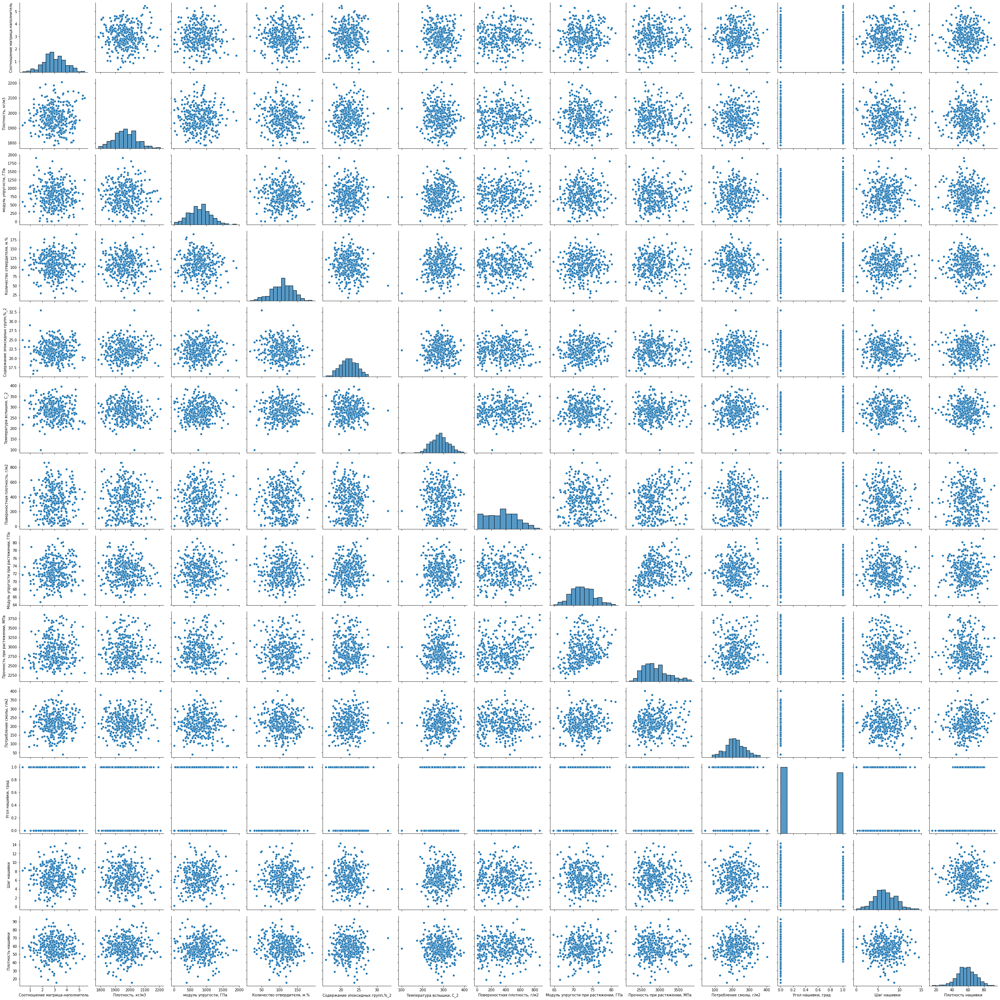

In [77]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_0, height=3)

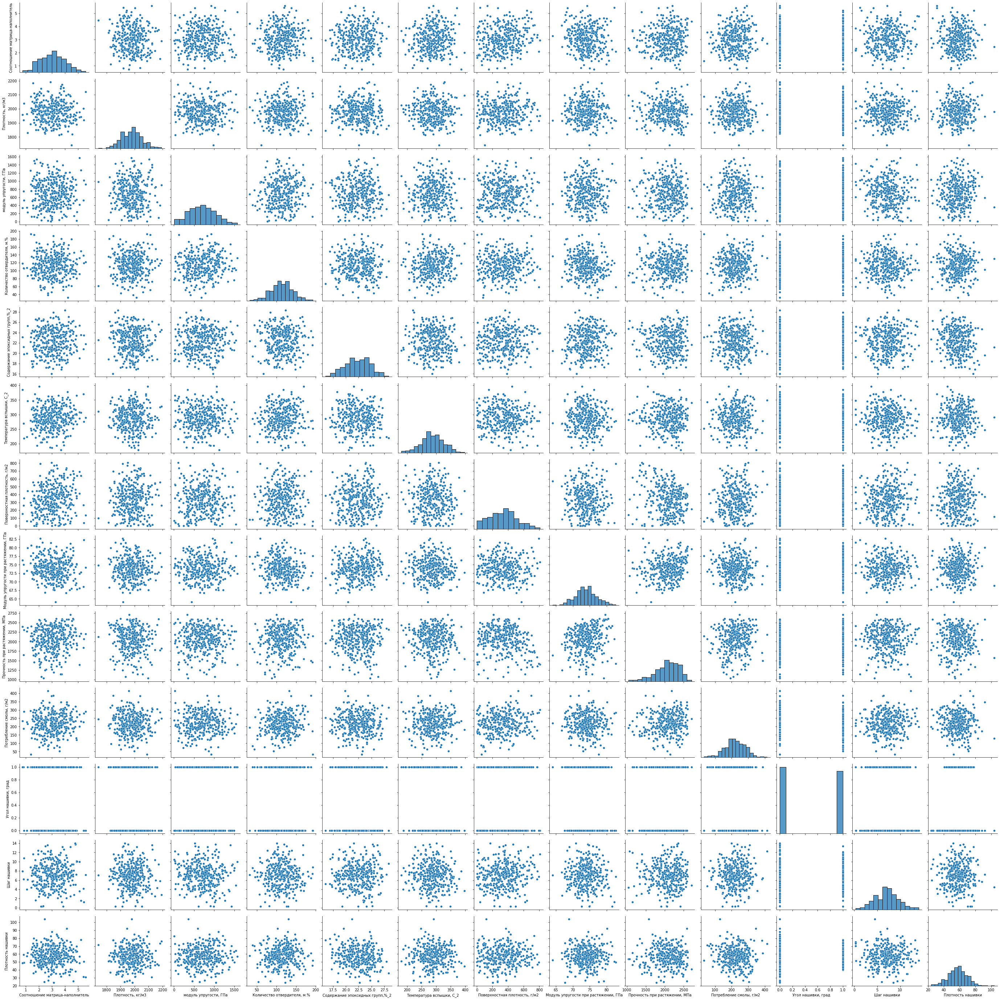

In [78]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_1, height=3)

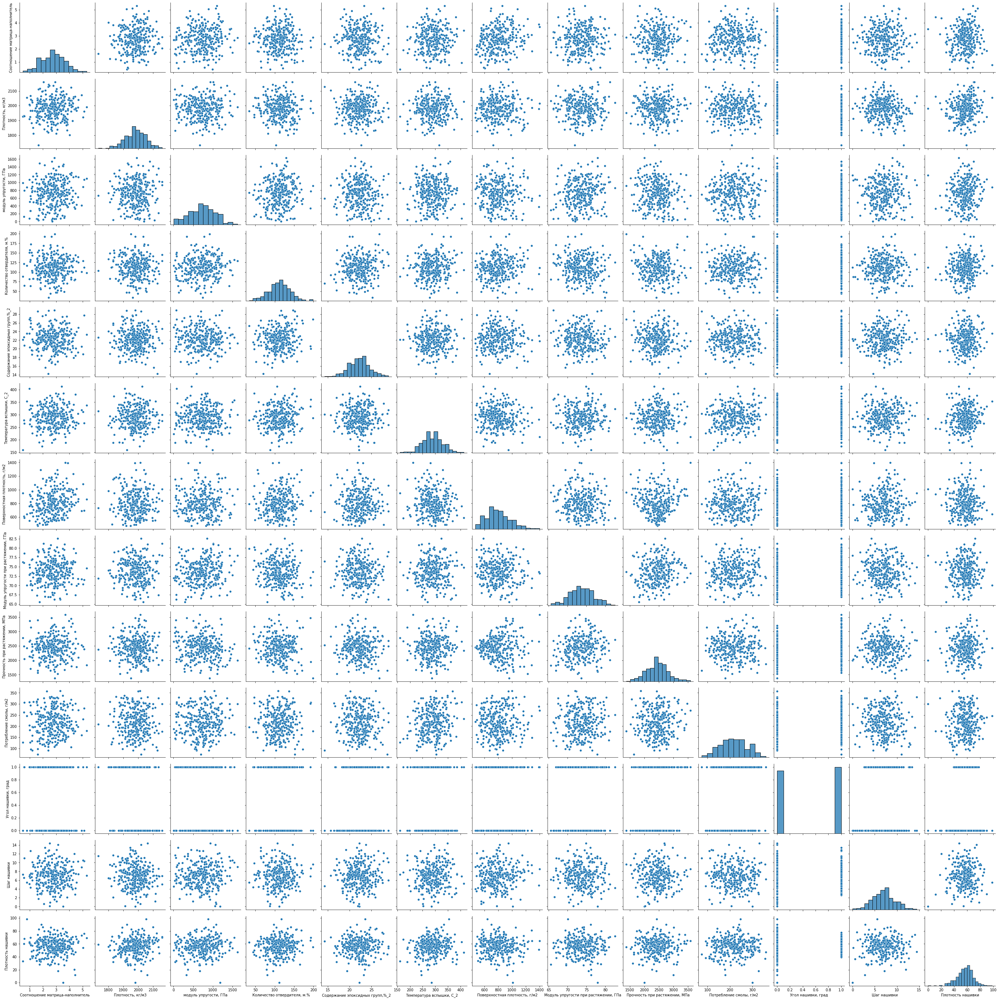

In [79]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(ddf_2, height=3)

In [80]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
#sns.pairplot(ddf_3, height=3)

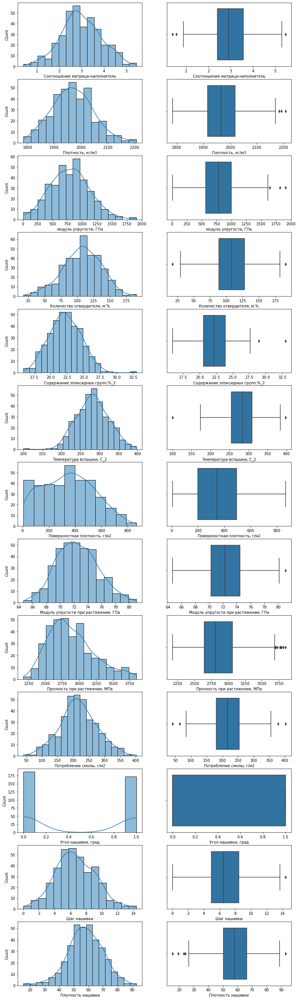

In [81]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_0.columns):    
    sns.histplot(data=ddf_0, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_0, x=column, ax=axes[k, 1])
plt.show()

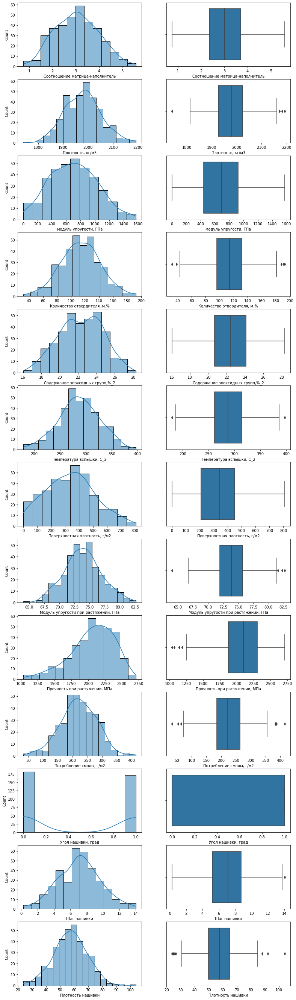

In [82]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_1.columns):    
    sns.histplot(data=ddf_1, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_1, x=column, ax=axes[k, 1])
plt.show()

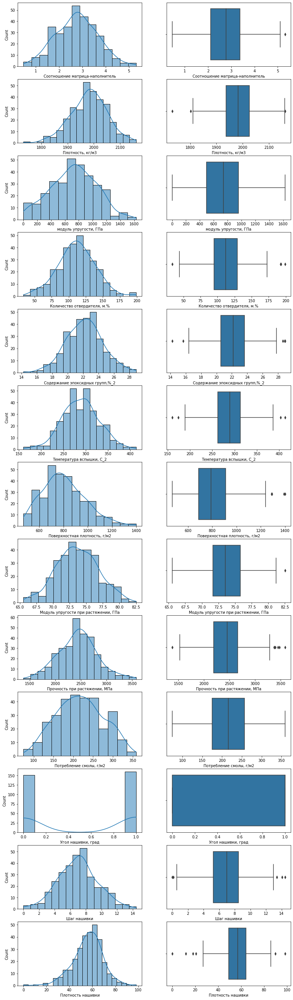

In [83]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(ddf_2.columns):    
    sns.histplot(data=ddf_2, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=ddf_2, x=column, ax=axes[k, 1])
plt.show()

In [84]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
#fig, axes = plt.subplots(13, 2, figsize=(13, 48))
#for k, column in enumerate(ddf_3.columns):    
#    sns.histplot(data=ddf_3, x=column, kde=True, ax=axes[k, 0])
#    sns.boxplot(data=ddf_3, x=column, ax=axes[k, 1])
#plt.show()

Параметр 'Угол нашивки' - категориальный, поэтому требуется его исключение при оценке нормальности распределения и для построения матрицы корреляции по критерию Пирсона

In [85]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
ddf_0d=ddf_0[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [86]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
ddf_1d=ddf_1[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [87]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
ddf_2d=ddf_2[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [88]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
#ddf_3d=ddf_3[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [89]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
ddf_0d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [90]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
ddf_1d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [91]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
ddf_2d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [92]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
#ddf_3d.columns

### 2. Оценка нормальности распределения параметров

In [93]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in ddf_0d.columns:
    alpha = 0.05
    stat, p = stats.shapiro(ddf_0d[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.996, p-value=0.502
Плотность, кг/м3 : 	 	 	Statistics=0.995, p-value=0.274
модуль упругости, ГПа : 	 	 	Statistics=0.996, p-value=0.412
Количество отвердителя, м.% : 	 	 	Statistics=0.995, p-value=0.297
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.992, p-value=0.067
Температура вспышки, С_2 : 	 	 	Statistics=0.993, p-value=0.117
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.978, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.994, p-value=0.206
Прочность при растяжении, МПа : 	 	 	Statistics=0.964, p-value=0.000
Потребление смолы, г/м2 : 	 	 	Statistics=0.997, p-value=0.727
Шаг нашивки : 	 	 	Statistics=0.995, p-value=0.359
Плотность нашивки : 	 	 	Statistics=0.994, p-value=0.160

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспы

In [106]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in ddf_1d.columns:
    alpha = 0.05
    stat, p = stats.shapiro(ddf_1d[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.994, p-value=0.208
Плотность, кг/м3 : 	 	 	Statistics=0.997, p-value=0.668
модуль упругости, ГПа : 	 	 	Statistics=0.992, p-value=0.053
Количество отвердителя, м.% : 	 	 	Statistics=0.998, p-value=0.974
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.991, p-value=0.033
Температура вспышки, С_2 : 	 	 	Statistics=0.997, p-value=0.739
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.988, p-value=0.006
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.997, p-value=0.682
Прочность при растяжении, МПа : 	 	 	Statistics=0.967, p-value=0.000
Потребление смолы, г/м2 : 	 	 	Statistics=0.997, p-value=0.792
Шаг нашивки : 	 	 	Statistics=0.996, p-value=0.611
Плотность нашивки : 	 	 	Statistics=0.996, p-value=0.527

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Температура вспышки, С_2', 'Модуль упругости при ра

In [107]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in ddf_2d.columns:
    alpha = 0.05
    stat, p = stats.shapiro(ddf_2d[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.997, p-value=0.799
Плотность, кг/м3 : 	 	 	Statistics=0.995, p-value=0.459
модуль упругости, ГПа : 	 	 	Statistics=0.993, p-value=0.125
Количество отвердителя, м.% : 	 	 	Statistics=0.996, p-value=0.604
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.997, p-value=0.862
Температура вспышки, С_2 : 	 	 	Statistics=0.997, p-value=0.811
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.977, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.996, p-value=0.678
Прочность при растяжении, МПа : 	 	 	Statistics=0.994, p-value=0.315
Потребление смолы, г/м2 : 	 	 	Statistics=0.989, p-value=0.022
Шаг нашивки : 	 	 	Statistics=0.997, p-value=0.744
Плотность нашивки : 	 	 	Statistics=0.981, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспы

### 3. Оценка корреляции параметров

Корреляция для количественных параметров и количественно-категориальных оценивается по критериям Пирсона и Спирмена соответственно

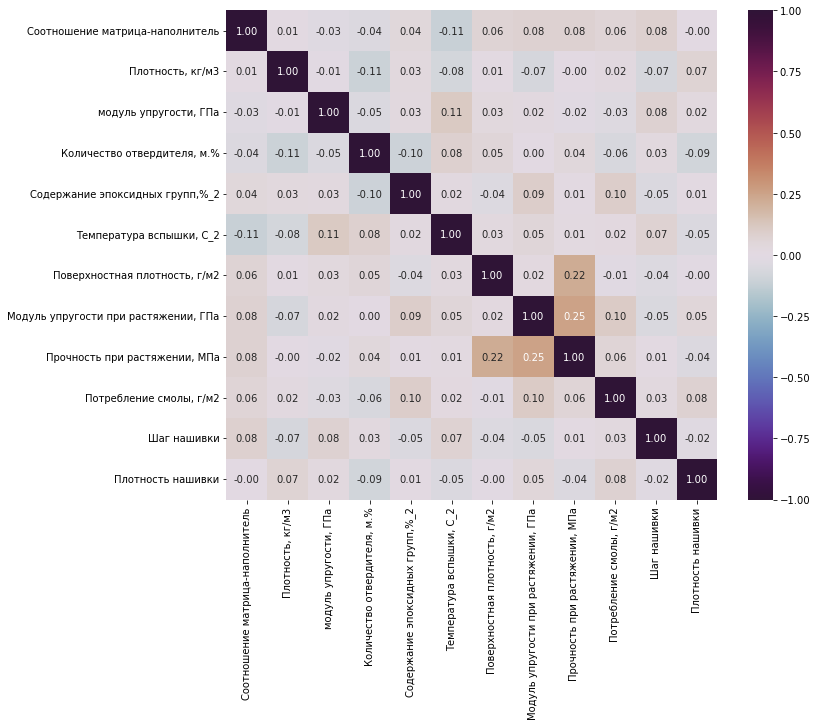

In [108]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_0d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [109]:
# Проверка по критерию Пирсона
count = 0 
for col in ddf_0d.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in ddf_0d.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(ddf_0d[col], ddf_0d[col1]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))


1
Соотношение матрица-наполнитель





Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : 		 
Statistics=-0.113, p-value=0.033







2
Плотность, кг/м3


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Количество отвердителя, м.% : 		 
Statistics=-0.106, p-value=0.046









3
модуль упругости, ГПа



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Температура вспышки, С_2 : 		 
Statistics=0.110, p-value=0.036







4
Количество отвердителя, м.%









5
Содержание эпоксидных групп,%_2








6
Температура вспышки, С_2







7
Поверхностная плотность, г/м2


Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : 		 
Statistics=0.222, p-value=0.000




8
Модуль упругости при растяжении, ГПа

Наименование колонок и строк С корреляцией: 
Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа : 		 
Statistics=0.25

Вывод: статистически значимыми по критерию Пирсона оказываются следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : Statistics=-0.113, p-value=0.033
    Плотность, кг/м3  &  Количество отвердителя, м.% : Statistics=-0.106, p-value=0.046
    модуль упругости, ГПа  &  Температура вспышки, С_2 : Statistics=0.110, p-value=0.036
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=0.222, p-value=0.000
    Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа : Statistics=0.254, p-value=0.000

Наименование колонок с данными БЕЗ нормального распределения : 'Поверхностная плотность, г/м2', 'Прочность при растяжении, МПа'

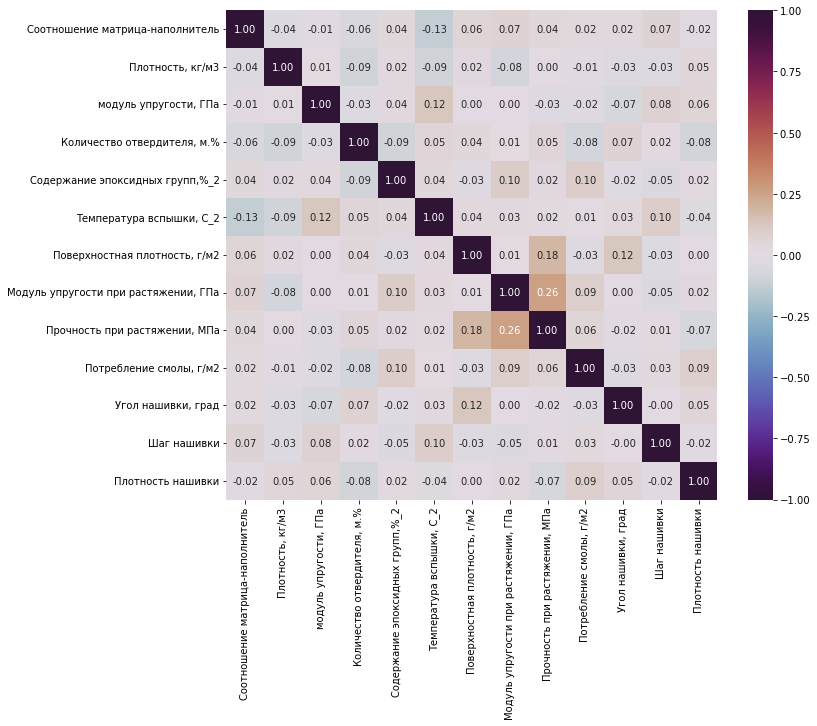

In [110]:
# Мартица корреляции по ранговому критерию корреляции Спирмена для категориальных и количественно-категориальных параметров
fig, ax = plt.subplots(figsize=(11, 9)) # аргумент 'spearman' указывает на критерий Спирмена
hm = sns.heatmap(ddf_0.corr(method = 'spearman'),  vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)

In [111]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in ddf_0.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(ddf_0['Угол нашивки, град'] , ddf_0[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.024, p-value=0.655
Плотность, кг/м3 : 	 	 	Statistics=-0.034, p-value=0.520
модуль упругости, ГПа : 	 	 	Statistics=-0.065, p-value=0.218
Количество отвердителя, м.% : 	 	 	Statistics=0.071, p-value=0.177
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=-0.020, p-value=0.699
Температура вспышки, С_2 : 	 	 	Statistics=0.029, p-value=0.590
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.122, p-value=0.021
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.001, p-value=0.991
Прочность при растяжении, МПа : 	 	 	Statistics=-0.018, p-value=0.729
Потребление смолы, г/м2 : 	 	 	Statistics=-0.026, p-value=0.623
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=-0.001, p-value=0.978
Плотность нашивки : 	 	 	Statistics=0.051, p-value=0.334

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГП

In [112]:
# Проверка по критерию Спирмена
count = 0 
for col in ddf_0.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in ddf_0.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(ddf_0[col], ddf_0[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))


1
Соотношение матрица-наполнитель





Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : 		 
Statistics=-0.129, p-value=0.015








2
Плотность, кг/м3












3
модуль упругости, ГПа



Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Температура вспышки, С_2 : 		 
Statistics=0.124, p-value=0.018








4
Количество отвердителя, м.%










5
Содержание эпоксидных групп,%_2









6
Температура вспышки, С_2








7
Поверхностная плотность, г/м2


Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : 		 
Statistics=0.183, p-value=0.000


Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Угол нашивки, град : 		 
Statistics=0.122, p-value=0.021



8
Модуль упругости при растяжении, ГПа

Наименование колонок и строк С корреляцией: 
Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа : 		 
Stati

Вывод: кроме того для параметров 'модуль упругости, ГПа', 'Поверхностная плотность', 'Плотность нашивки' и 'Относительное удлинение' проверка по критерию Спирмена показала, что значимы следующие корреляции:

    Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : Statistics=-0.129, p-value=0.015
    модуль упругости, ГПа  &  Температура вспышки, С_2 : Statistics=0.124, p-value=0.018
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=0.183, p-value=0.000
    Поверхностная плотность, г/м2  &  Угол нашивки, град : Statistics=0.122, p-value=0.021
    Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа : Statistics=0.262, p-value=0.000

Наименование колонок с данными БЕЗ нормального распределения : 'Поверхностная плотность, г/м2', 'Прочность при растяжении, МПа'

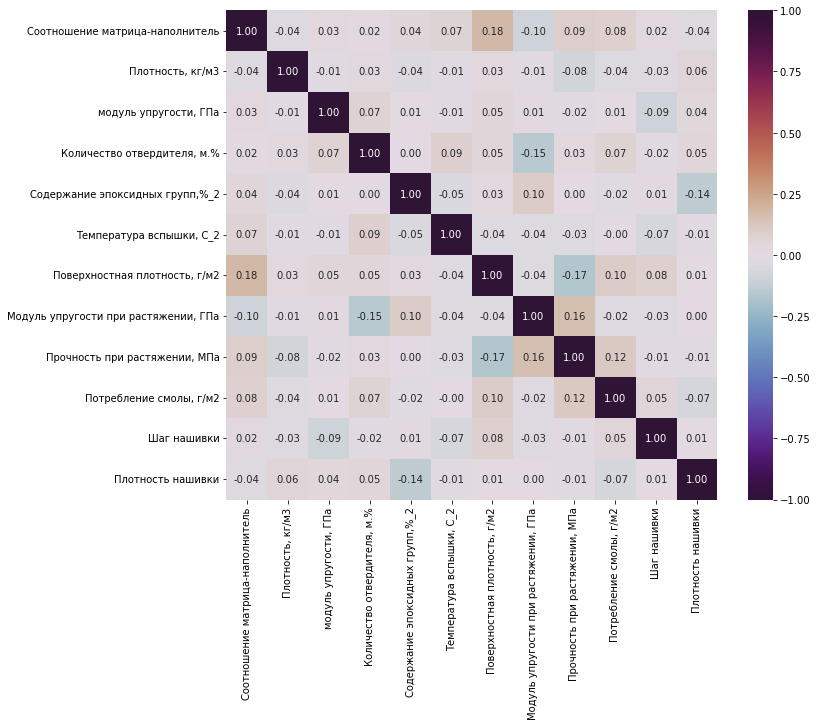

In [113]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_1d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [114]:
# Проверка по критерию Пирсона
count = 0 
for col in ddf_1d.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in ddf_1d.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(ddf_1d[col], ddf_1d[col1]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))


1
Соотношение матрица-наполнитель






Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.177, p-value=0.001






2
Плотность, кг/м3











3
модуль упругости, ГПа










4
Количество отвердителя, м.%




Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.155, p-value=0.004





5
Содержание эпоксидных групп,%_2







Наименование колонок и строк С корреляцией: 
Содержание эпоксидных групп,%_2  &  Плотность нашивки : 		 
Statistics=-0.141, p-value=0.008

6
Температура вспышки, С_2







7
Поверхностная плотность, г/м2


Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : 		 
Statistics=-0.171, p-value=0.001




8
Модуль упругости при растяжении, ГПа

Наименование колонок и строк С корреляцией: 
Модуль упругости при растяжении, ГПа  &  Прочность при растяжен

Вывод: статистически значимыми по критерию Пирсона оказываются следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : Statistics=-0.112, p-value=0.033
    Плотность, кг/м3  &  Количество отвердителя, м.% : Statistics=-0.106, p-value=0.045
    модуль упругости, ГПа  &  Температура вспышки, С_2 : Statistics=0.110, p-value=0.036
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=0.219, p-value=0.000
    Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа : Statistics=0.252, p-value=0.000


Наименование колонок с данными БЕЗ нормального распределения : ['Содержание эпоксидных групп,%_2', 'Поверхностная плотность, г/м2', 'Прочность при растяжении, МПа']

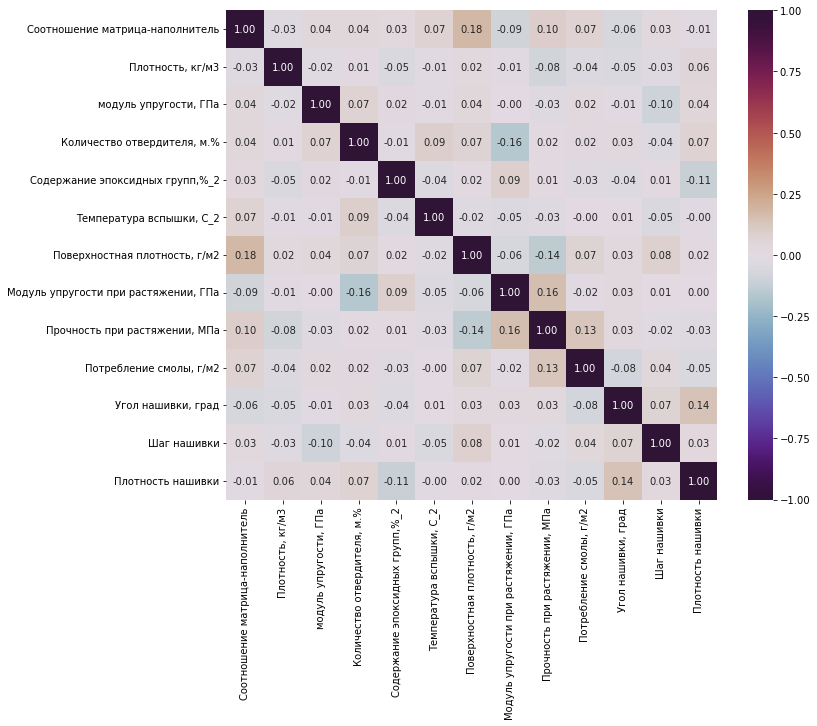

In [115]:
# Мартица корреляции по ранговому критерию корреляции Спирмена для категориальных и количественно-категориальных параметров
fig, ax = plt.subplots(figsize=(11, 9)) # аргумент 'spearman' указывает на критерий Спирмена
hm = sns.heatmap(ddf_1.corr(method = 'spearman'),  vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)

In [116]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in ddf_1.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(ddf_1['Угол нашивки, град'] , ddf_1[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=-0.063, p-value=0.239
Плотность, кг/м3 : 	 	 	Statistics=-0.049, p-value=0.363
модуль упругости, ГПа : 	 	 	Statistics=-0.005, p-value=0.924
Количество отвердителя, м.% : 	 	 	Statistics=0.031, p-value=0.563
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=-0.035, p-value=0.507
Температура вспышки, С_2 : 	 	 	Statistics=0.007, p-value=0.899
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.030, p-value=0.570
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.028, p-value=0.596
Прочность при растяжении, МПа : 	 	 	Statistics=0.026, p-value=0.624
Потребление смолы, г/м2 : 	 	 	Statistics=-0.080, p-value=0.134
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.070, p-value=0.191
Плотность нашивки : 	 	 	Statistics=0.145, p-value=0.006

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа

In [117]:
# Проверка по критерию Спирмена
count = 0 
for col in ddf_1.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in ddf_1.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(ddf_1[col], ddf_1[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))


1
Соотношение матрица-наполнитель






Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.178, p-value=0.001







2
Плотность, кг/м3












3
модуль упругости, ГПа











4
Количество отвердителя, м.%




Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.161, p-value=0.002






5
Содержание эпоксидных групп,%_2








Наименование колонок и строк С корреляцией: 
Содержание эпоксидных групп,%_2  &  Плотность нашивки : 		 
Statistics=-0.112, p-value=0.035

6
Температура вспышки, С_2








7
Поверхностная плотность, г/м2


Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : 		 
Statistics=-0.137, p-value=0.010





8
Модуль упругости при растяжении, ГПа

Наименование колонок и строк С корреляцией: 
Модуль упругости при растяжении, ГПа  &  Прочность при р

Вывод: кроме того для параметров 'модуль упругости, ГПа', 'Поверхностная плотность', 'Плотность нашивки' и 'Относительное удлинение' проверка по критерию Спирмена показала, что значимы следующие корреляции:

    Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : Statistics=-0.128, p-value=0.015
    модуль упругости, ГПа  &  Температура вспышки, С_2 : Statistics=0.124, p-value=0.018
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=0.180, p-value=0.001
    Поверхностная плотность, г/м2  &  Угол нашивки, град : Statistics=0.124, p-value=0.019
    Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа : Statistics=0.260, p-value=0.000
    
Наименование колонок с данными БЕЗ нормального распределения : ['Содержание эпоксидных групп,%_2', 'Поверхностная плотность, г/м2', 'Прочность при растяжении, МПа']

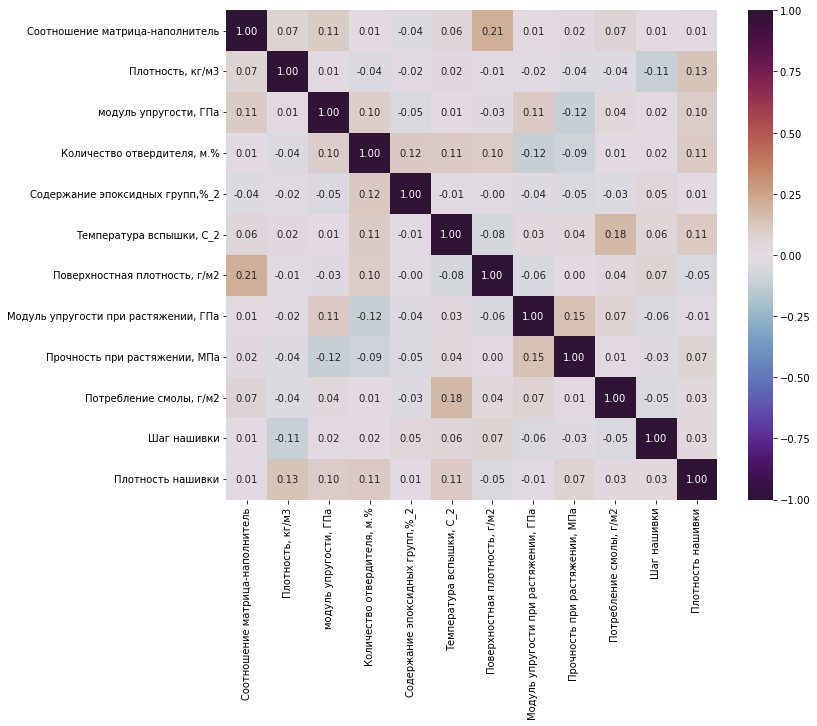

In [118]:
# Матрица корреляции по Пирсону для количественных параметров
corr = ddf_2d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [119]:
# Проверка по критерию Пирсона
count = 0 
for col in ddf_2d.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in ddf_2d.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(ddf_2d[col], ddf_2d[col1]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))


1
Соотношение матрица-наполнитель






Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.208, p-value=0.000






2
Плотность, кг/м3









Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Шаг нашивки : 		 
Statistics=-0.115, p-value=0.043

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.135, p-value=0.017

3
модуль упругости, ГПа





Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=0.113, p-value=0.047

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Прочность при растяжении, МПа : 		 
Statistics=-0.121, p-value=0.032




4
Количество отвердителя, м.%

Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Содержание эпоксидных групп,%_2 : 		 
Statistics=0.117, p-value=0.039



Наименование колонок и строк С кор

Вывод: статистически значимыми по критерию Пирсона оказываются следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : Statistics=-0.105, p-value=0.047
    Плотность, кг/м3  &  Количество отвердителя, м.% : Statistics=-0.105, p-value=0.047
    модуль упругости, ГПа  &  Температура вспышки, С_2 : Statistics=0.104, p-value=0.049
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=0.220, p-value=0.000
    Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа 0 : Statistics=0.251, p-value=0.000


Наименование колонок с данными БЕЗ нормального распределения : ['Поверхностная плотность, г/м2', 'Потребление смолы, г/м2', 'Плотность нашивки']

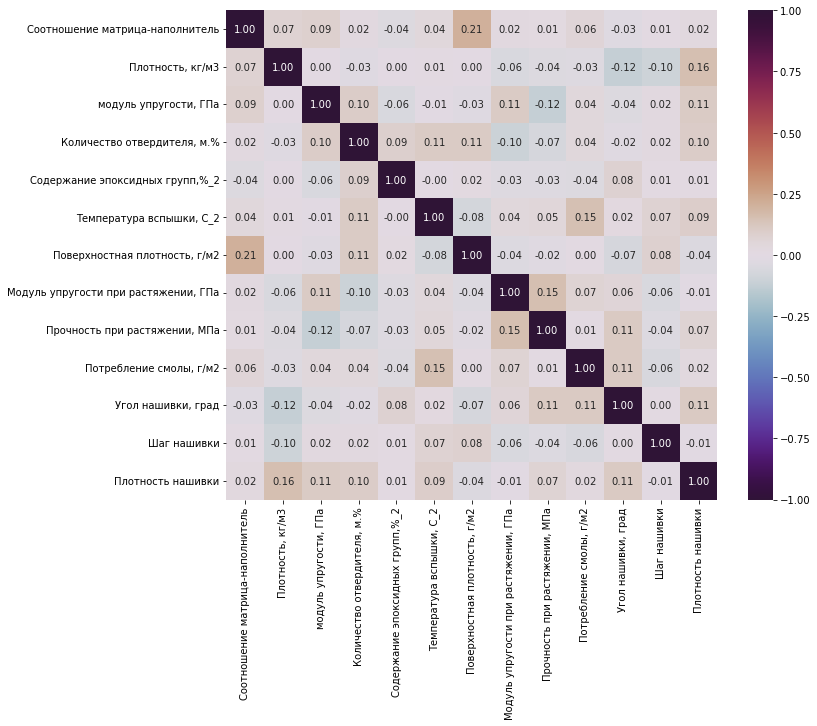

In [120]:
# Мартица корреляции по ранговому критерию корреляции Спирмена для категориальных и количественно-категориальных параметров
fig, ax = plt.subplots(figsize=(11, 9)) # аргумент 'spearman' указывает на критерий Спирмена
hm = sns.heatmap(ddf_2.corr(method = 'spearman'),  vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)

In [121]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in ddf_2.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(ddf_2['Угол нашивки, град'] , ddf_2[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=-0.028, p-value=0.620
Плотность, кг/м3 : 	 	 	Statistics=-0.119, p-value=0.036
модуль упругости, ГПа : 	 	 	Statistics=-0.042, p-value=0.464
Количество отвердителя, м.% : 	 	 	Statistics=-0.022, p-value=0.695
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.077, p-value=0.178
Температура вспышки, С_2 : 	 	 	Statistics=0.017, p-value=0.764
Поверхностная плотность, г/м2 : 	 	 	Statistics=-0.067, p-value=0.239
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.056, p-value=0.324
Прочность при растяжении, МПа : 	 	 	Statistics=0.113, p-value=0.047
Потребление смолы, г/м2 : 	 	 	Statistics=0.112, p-value=0.048
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.005, p-value=0.932
Плотность нашивки : 	 	 	Statistics=0.113, p-value=0.046

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'модуль упругости, ГПа', 'Количество отвер

In [122]:
# Проверка по критерию Спирмена
count = 0 
for col in ddf_2.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in ddf_2.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(ddf_2[col], ddf_2[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))


1
Соотношение матрица-наполнитель






Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.207, p-value=0.000







2
Плотность, кг/м3









Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=-0.119, p-value=0.036


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.155, p-value=0.006

3
модуль упругости, ГПа






Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Прочность при растяжении, МПа : 		 
Statistics=-0.118, p-value=0.037





4
Количество отвердителя, м.%










5
Содержание эпоксидных групп,%_2









6
Температура вспышки, С_2




Наименование колонок и строк С корреляцией: 
Температура вспышки, С_2  &  Потребление смолы, г/м2 : 		 
Statistics=0.150, p-value=0.008




7
Поверхностная плотность, г/м2







8
Модуль упругости при растяжении, ГПа

Наименование колон

Вывод: кроме того для параметров 'модуль упругости, ГПа', 'Поверхностная плотность', 'Плотность нашивки' и 'Относительное удлинение' проверка по критерию Спирмена показала, что значимы следующие корреляции:

    Соотношение матрица-наполнитель  &  Температура вспышки, С_2 : Statistics=-0.120, p-value=0.023
    модуль упругости, ГПа  &  Температура вспышки, С_2 : Statistics=0.119, p-value=0.024
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=0.179, p-value=0.001
    Поверхностная плотность, г/м2  &  Угол нашивки, град : Statistics=0.116, p-value=0.027
    Модуль упругости при растяжении, ГПа  &  Прочность при растяжении, МПа : Statistics=0.257, p-value=0.000
    
Наименование колонок с данными БЕЗ нормального распределения : ['Поверхностная плотность, г/м2', 'Потребление смолы, г/м2', 'Плотность нашивки']

In [123]:
# Матрица корреляции по Пирсону для количественных параметров
#corr = ddf_3d.corr() # Пирсон установлен по умолчанию
#fig, ax = plt.subplots(figsize=(11, 9))
#sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
#plt.show()

### 5. Построение моделей статистической регрессии

In [124]:
# Загрузка библиотек sklearn для проведения регрессионного анализа
import sklearn.linear_model as lm
import statsmodels.formula.api as smf

###### Анализ общей модели множественной регрессии

In [125]:
# Создание нового датасета ff для модели множественной регрессии
ff0 = ddf_0
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff0 = ff0.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff0.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [126]:
# Создание нового датасета ff для модели множественной регрессии
ff1 = ddf_1
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff1 = ff1.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff1.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,2.561475,1900.0,535.0,111.86,22.267857,284.615385,380.0,75.000000,1800.000000,120.0,0,7.0,47.0
1,3.557018,1930.0,889.0,129.00,21.250000,300.000000,380.0,75.000000,1800.000000,120.0,0,7.0,57.0
2,2.919678,1980.0,568.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,60.0
3,4.029126,1910.0,800.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,70.0
4,4.193548,1950.0,506.0,129.00,21.250000,300.000000,380.0,75.000000,1800.000000,120.0,0,10.0,60.0


In [127]:
# Создание нового датасета ff для модели множественной регрессии
ff2 = ddf_2
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff2 = ff2.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff2.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,3.532338,2100.0,1421.0,129.00,21.250000,300.000000,1010.0,78.000000,2000.000000,300.0,0,7.0,60.0
1,2.919678,2160.0,933.0,129.00,21.250000,300.000000,1010.0,78.000000,2000.000000,300.0,0,7.0,70.0
2,2.877358,1990.0,1628.0,129.00,21.250000,300.000000,1010.0,78.000000,2000.000000,300.0,0,9.0,47.0
3,1.598174,1950.0,827.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,57.0
4,3.532338,1980.0,1183.0,111.86,22.267857,284.615385,1010.0,78.000000,2000.000000,300.0,0,0.0,0.0


In [128]:
# Создание нового датасета ff для модели множественной регрессии
#ff3 = ddf_3
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
#ff3 = ff3.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
#ff3.head()

In [129]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff0 = pd.concat((ff0,pd.get_dummies(ff0.col11, prefix="col11", prefix_sep='',)),1)
ff0.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_11824\3663672012.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff0 = pd.concat((ff0,pd.get_dummies(ff0.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0,1,0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,1,0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0,1,0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,1,0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,1,0


In [130]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff1 = pd.concat((ff1,pd.get_dummies(ff1.col11, prefix="col11", prefix_sep='',)),1)
ff1.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_11824\2177107136.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff1 = pd.concat((ff1,pd.get_dummies(ff1.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,2.561475,1900.0,535.0,111.86,22.267857,284.615385,380.0,75.000000,1800.000000,120.0,0,7.0,47.0,1,0
1,3.557018,1930.0,889.0,129.00,21.250000,300.000000,380.0,75.000000,1800.000000,120.0,0,7.0,57.0,1,0
2,2.919678,1980.0,568.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,60.0,1,0
3,4.029126,1910.0,800.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,70.0,1,0
4,4.193548,1950.0,506.0,129.00,21.250000,300.000000,380.0,75.000000,1800.000000,120.0,0,10.0,60.0,1,0


In [131]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff2 = pd.concat((ff2,pd.get_dummies(ff2.col11, prefix="col11", prefix_sep='',)),1)
ff2.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_11824\1420413336.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff2 = pd.concat((ff2,pd.get_dummies(ff2.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,3.532338,2100.0,1421.0,129.00,21.250000,300.000000,1010.0,78.000000,2000.000000,300.0,0,7.0,60.0,1,0
1,2.919678,2160.0,933.0,129.00,21.250000,300.000000,1010.0,78.000000,2000.000000,300.0,0,7.0,70.0,1,0
2,2.877358,1990.0,1628.0,129.00,21.250000,300.000000,1010.0,78.000000,2000.000000,300.0,0,9.0,47.0,1,0
3,1.598174,1950.0,827.0,129.00,21.250000,300.000000,470.0,73.333333,2455.555556,220.0,0,9.0,57.0,1,0
4,3.532338,1980.0,1183.0,111.86,22.267857,284.615385,1010.0,78.000000,2000.000000,300.0,0,0.0,0.0,1,0


In [132]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
#ff3 = pd.concat((ff3,pd.get_dummies(ff3.col11, prefix="col11", prefix_sep='',)),1)
#ff3.head()

In [133]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff0).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.100
Model:                            OLS   Adj. R-squared:                  0.069
Method:                 Least Squares   F-statistic:                     3.200
Date:                Wed, 26 Apr 2023   Prob (F-statistic):           0.000229
Time:                        22:36:51   Log-Likelihood:                -879.67
No. Observations:                 359   AIC:                             1785.
Df Residuals:                     346   BIC:                             1836.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     66.8539      4.636     14.419      0.000      57.735      75.973
col1           0.2130      0.172      1.237      0.217      -0.126       0.552
col2          -0.0030      0.002     -1.523      0.129      -0.007       0.001
col3           0.0003      0.000      0.549      0.583      -0.001       0.001
col4           0.0004      0.005      0.081      0.936      -0.010       0.011
col5           0.0961      0.063      1.523      0.129      -0.028       0.220
col6           0.0037      0.004      1.014      0.311      -0.004       0.011
col7          -0.0006      0.001     -0.812      0.417      -0.002       0.001
col9           0.0023      0.000      4.863      0.000       0.001       0.003
col10          0.0037      0.003      1.428      0.154      -0.001       0.009
col12         -0.0821      0.061     -1.356      0.176      -0.201       0.037
col13          0.0149      0.013      1.180      0.239      -0.010       0.040
col110         0.0094      0.308      0.030      0.976      -0.596       0.614
==============================================================================
Omnibus:                        4.103   Durbin-Watson:                   1.850
Prob(Omnibus):                  0.129   Jarque-Bera (JB):                3.381
Skew:                           0.137   Prob(JB):                        0.184
Kurtosis:                       2.612   Cond. No.                     1.12e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.12e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [134]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff1).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.075
Model:                            OLS   Adj. R-squared:                  0.043
Method:                 Least Squares   F-statistic:                     2.311
Date:                Wed, 26 Apr 2023   Prob (F-statistic):            0.00759
Time:                        22:36:51   Log-Likelihood:                -885.00
No. Observations:                 353   AIC:                             1796.
Df Residuals:                     340   BIC:                             1846.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     69.7648      5.283     13.205      0.000      59.373      80.157
col1          -0.3782      0.180     -2.104      0.036      -0.732      -0.025
col2           0.0004      0.002      0.175      0.861      -0.004       0.005
col3           0.0003      0.000      0.514      0.608      -0.001       0.001
col4          -0.0177      0.006     -3.046      0.003      -0.029      -0.006
col5           0.1379      0.069      2.010      0.045       0.003       0.273
col6          -0.0006      0.004     -0.143      0.886      -0.009       0.008
col7           0.0003      0.001      0.308      0.759      -0.002       0.002
col9           0.0017      0.001      3.290      0.001       0.001       0.003
col10         -0.0011      0.003     -0.396      0.692      -0.006       0.004
col12         -0.0354      0.063     -0.563      0.574      -0.159       0.088
col13          0.0049      0.014      0.356      0.722      -0.022       0.032
col110         0.0160      0.329      0.049      0.961      -0.632       0.664
==============================================================================
Omnibus:                        2.002   Durbin-Watson:                   2.023
Prob(Omnibus):                  0.367   Jarque-Bera (JB):                2.011
Skew:                           0.182   Prob(JB):                        0.366
Kurtosis:                       2.934   Cond. No.                     9.83e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.83e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [135]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff2).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.066
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     1.759
Date:                Wed, 26 Apr 2023   Prob (F-statistic):             0.0545
Time:                        22:36:52   Log-Likelihood:                -784.32
No. Observations:                 311   AIC:                             1595.
Df Residuals:                     298   BIC:                             1643.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     72.8911      5.842     12.477      0.000      61.395      84.388
col1           0.0006      0.203      0.003      0.998      -0.398       0.399
col2          -0.0006      0.003     -0.223      0.823      -0.006       0.005
col3           0.0014      0.001      2.491      0.013       0.000       0.002
col4          -0.0131      0.007     -1.958      0.051      -0.026    6.66e-05
col5          -0.0106      0.074     -0.144      0.886      -0.156       0.134
col6           0.0025      0.004      0.577      0.565      -0.006       0.011
col7          -0.0008      0.001     -0.749      0.455      -0.003       0.001
col9           0.0012      0.000      2.523      0.012       0.000       0.002
col10          0.0028      0.003      0.929      0.353      -0.003       0.009
col12         -0.0630      0.070     -0.899      0.369      -0.201       0.075
col13         -0.0076      0.014     -0.538      0.591      -0.035       0.020
col110        -0.3306      0.364     -0.907      0.365      -1.048       0.387
==============================================================================
Omnibus:                        1.565   Durbin-Watson:                   1.883
Prob(Omnibus):                  0.457   Jarque-Bera (JB):                1.658
Skew:                           0.154   Prob(JB):                        0.436
Kurtosis:                       2.817   Cond. No.                     1.12e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.12e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [136]:
# Модель OLS множественной регрессии для параметра 'col8' - 'Модуль упругости при растяжении, ГПа'
#resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff3).fit()
#resultsm.summary()

Вывод: модели значимы, R-squared несколько возрос - до 0,082 - 0,099; некоторые параметры значимы: 'col9' - 'Прочность при растяжении, МПа' для датасета  ddf_0d;

'col1', 'col4', 'col9' - 'Соотношение матрица-наполнитель', 'Количество отвердителя, м.%', 'Прочность при растяжении, МПа' для датасета ddf_1d;

'col3', 'col4', 'col9' - 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Прочность при растяжении, МПа' для датасета ddf_2d

#### 6. Нормализация значений параметров с помощью метода MinMaxScaler

In [137]:
# Загрузка MinMaxScaler из библиотеки sklearn.preprocessing
from sklearn.preprocessing import MinMaxScaler

Датасет ddf_0d

In [138]:
# Применение MinMaxScaler для нормализации датасета df
min_max_scaler = MinMaxScaler()
df_norm = pd.DataFrame(min_max_scaler.fit_transform(ddf_0d), columns = ddf_0d.columns, index=ddf_0d.index)

In [139]:
# Описательная статистика нормализованного датасета df
df_norm.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
count,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000
mean,0.509958,0.434043,0.409264,0.516096,0.369729,0.613099,0.395602,0.475264,0.424163,0.487902,0.460105,0.547599
std,0.176381,0.184120,0.174544,0.168832,0.141669,0.141461,0.230141,0.181006,0.200603,0.163692,0.176479,0.156180
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.395486,0.309827,0.293010,0.408947,0.272588,0.521567,0.224535,0.339132,0.281910,0.388382,0.342327,0.451166
50%,0.496822,0.431233,0.408649,0.523806,0.366026,0.616355,0.392209,0.463094,0.381839,0.487826,0.451473,0.548099
75%,0.626762,0.554064,0.519398,0.635850,0.467372,0.704756,0.566730,0.598452,0.531543,0.590998,0.587021,0.656786
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


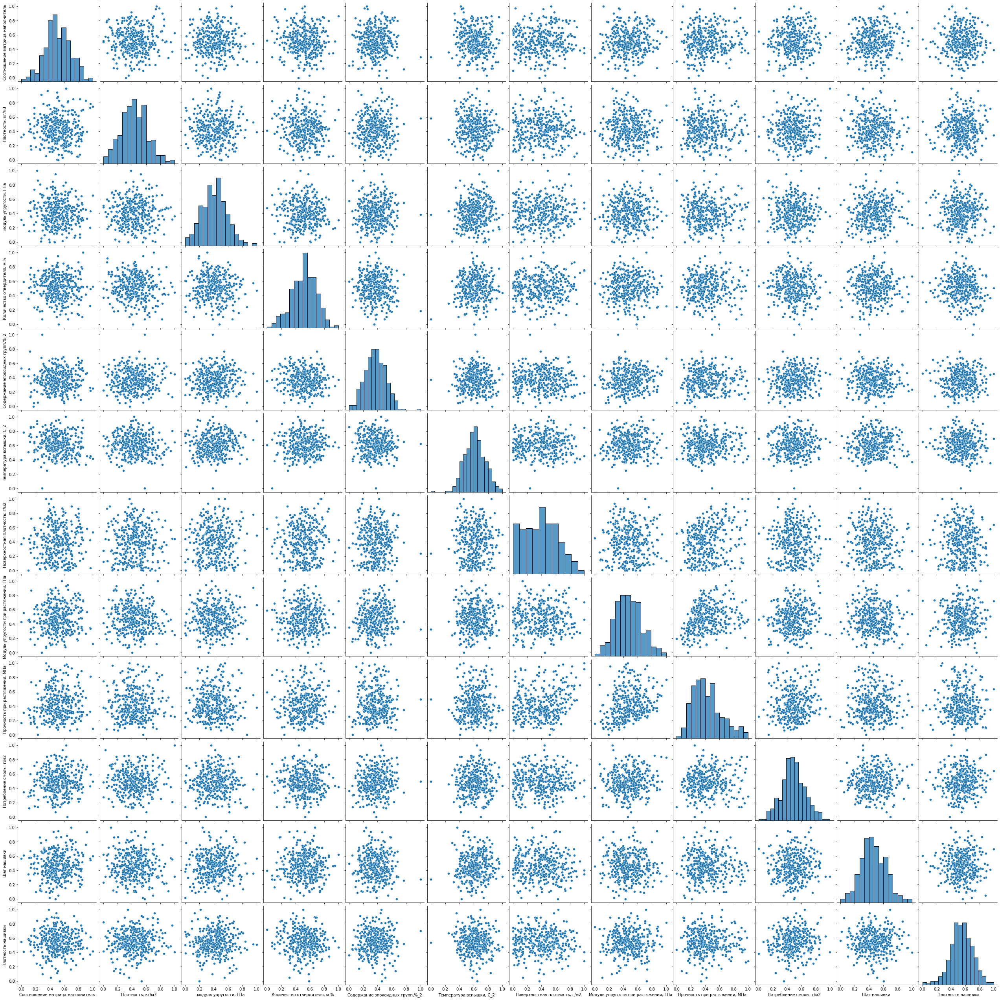

In [140]:
# Попарные графики рассеяния после нормализации
sns.pairplot(df_norm, height=3)

In [141]:
# Создание датасета df для моделей прогноза
df = df_norm.copy()

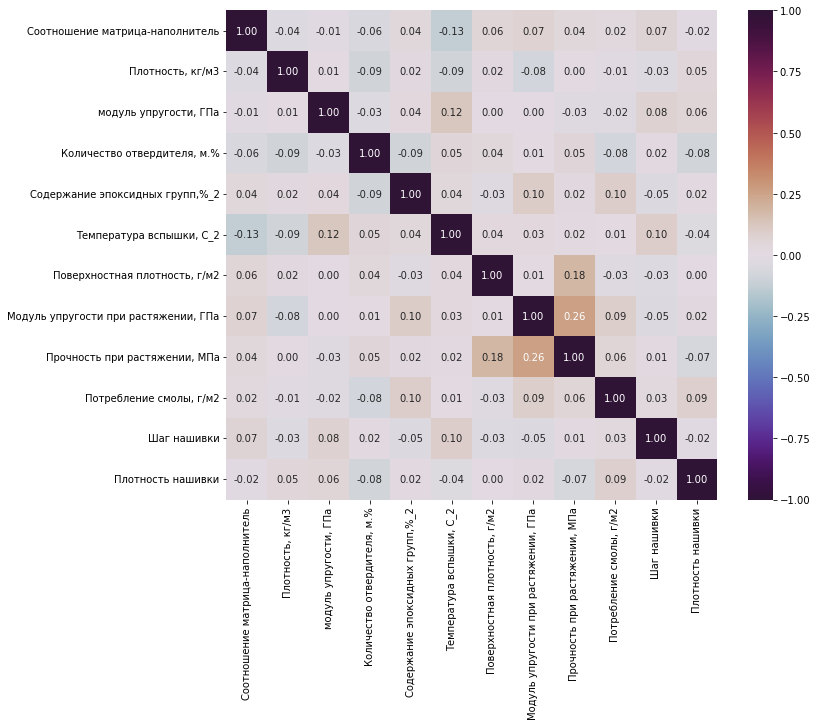

In [142]:
# Матрица корреляции по Спирмену после нормализации
corr = df_norm.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [143]:
# Параметр 'Угол нашивки, град' - категориальный, поэтому его исключаем 
# при построении матрицы корреляции по критерию Пирсона
df_dnorm=df_norm[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]
df_dnorm

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
0,0.289714,0.580021,0.383240,0.071039,0.373061,0.000000,0.236620,0.324242,0.492802,0.495553,0.276338,0.536239
1,0.289714,0.580021,0.383240,0.186929,0.459644,0.621284,0.236620,0.324242,0.492802,0.495553,0.276338,0.574925
2,0.289714,0.580021,0.383240,0.186349,1.000000,0.621284,0.236620,0.324242,0.492802,0.495553,0.276338,0.703878
3,0.289714,0.580021,0.383240,0.644693,0.313601,0.673058,0.236620,0.324242,0.492802,0.495553,0.346079,0.407285
4,0.470164,0.580021,0.390741,0.545376,0.373061,0.621284,0.236620,0.324242,0.492802,0.495553,0.346079,0.536239
...,...,...,...,...,...,...,...,...,...,...,...,...
354,0.663137,0.531451,0.123883,0.618676,0.250212,0.618425,0.289360,0.313929,0.247030,0.508612,0.411031,0.484489
355,0.357382,0.594021,0.748215,0.357816,0.175650,0.595662,0.451041,0.524085,0.904822,0.841883,0.478012,0.448676
356,0.649388,0.400177,0.576972,0.362307,0.442757,0.850602,0.041749,0.392130,0.240417,0.574965,0.576779,0.534695
357,0.662485,0.221324,0.198067,0.435134,0.414300,0.489460,0.090092,0.541913,0.487441,0.276137,0.529906,0.586841


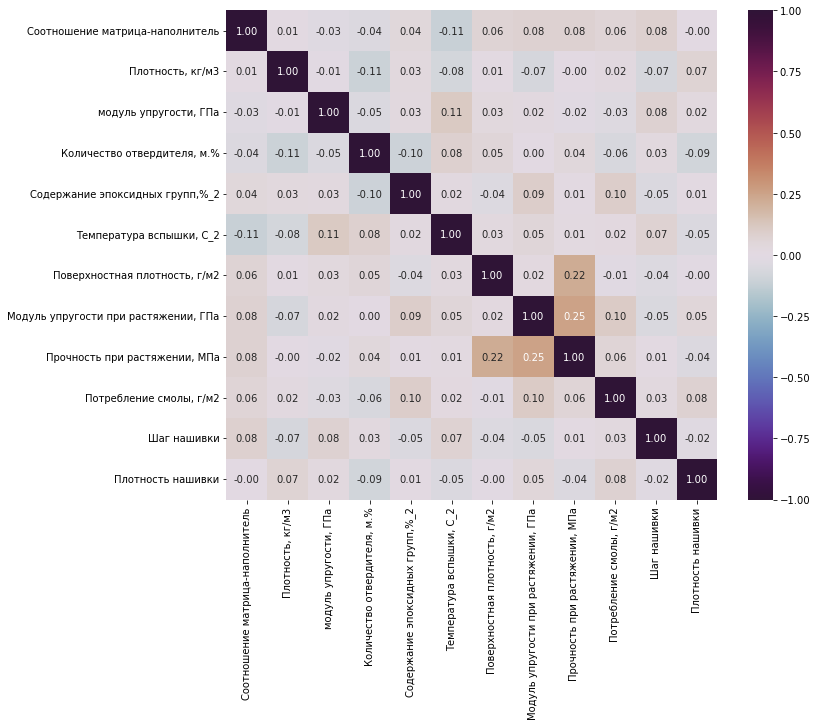

In [144]:
# Матрица корреляции по Пирсону после нормализации
corr = df_dnorm.corr() # Пирсон по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

#### 3. Модели для прогноза модуля упругости при растяжении и прочности при растяжении

In [145]:
# Загрузка модулей библиотеки sklearn для регрессоров и других библиотек
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

###### Разбиение данных на обучающую и тестовую выборки

In [146]:
# Назначение переменных для создания моделей
x_upr = df.drop(['Модуль упругости при растяжении, ГПа'], axis=1)
x_pr = df.drop(['Прочность при растяжении, МПа'], axis=1)
y_upr = df[['Модуль упругости при растяжении, ГПа']]
y_pr = df[['Прочность при растяжении, МПа']]
# Разбиение данных на обучающую и тестовую выборки
X_train_upr, X_test_upr, y_train_upr, y_test_upr = train_test_split(x_upr, y_upr, test_size=0.3, random_state=5)
X_train_pr, X_test_pr, y_train_pr, y_test_pr = train_test_split(x_pr, y_pr, test_size=0.3, random_state=5)

###### Метод К ближайших соседей

In [147]:
# Регрессор KNeighborsRegressor() для расчета методом K-ближайших соседей,
# используются унифицированные веса и настройки алгоритма по умолчанию
knr = KNeighborsRegressor()
knr_params = {'n_neighbors' : range(1, 301, 2), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }
# используется поиск по сетке GridSearchCV для upr
GSCV_knr_upr = GridSearchCV(knr, knr_params, n_jobs=-1, cv=10)
GSCV_knr_upr.fit(X_train_upr, y_train_upr)
GSCV_knr_upr.best_params_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [-0.74540619 -0.74540619 -0.17737138 ...         nan         nan
         nan]
  warnings.warn(


{'algorithm': 'auto', 'n_neighbors': 71, 'weights': 'distance'}

In [148]:
# Поиск по лучшей модели и вывод результатов для upr
knr_upr = GSCV_knr_upr.best_estimator_
print(f'R2-score KNR для модуля упругости при растяжении: {knr_upr.score(X_test_upr, y_test_upr).round(3)}')

R2-score KNR для модуля упругости при растяжении: 0.009


In [149]:
# Создание объекта pandas DataFrame()
models = pd.DataFrame()

In [150]:
# Запись результатов расчета в DataFrame()
knr_upr_result = pd.DataFrame({
   'Model': 'KNeighborsRegressor_upr', 
   'MAE': mean_absolute_error(y_test_upr, knr_upr.predict(X_test_upr)), 
   'R2 score': knr_upr.score(X_test_upr, y_test_upr).round(3)
}, index=['Модуль упругости при растяжении'])

In [151]:
# Соединение объектов DataFrame()
models = pd.concat([models, knr_upr_result])

In [152]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.155531,0.009


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель жает прогноз даже хуже, чем простое усреднение

In [153]:
# Используется поиск по сетке GridSearchCV для pr
GSCV_knr_pr = GridSearchCV(knr, knr_params, n_jobs=-1, cv=10)
GSCV_knr_pr.fit(X_train_pr, y_train_pr)
GSCV_knr_pr.best_params_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [-0.70389592 -0.70389592 -0.1884627  ...         nan         nan
         nan]
  warnings.warn(


{'algorithm': 'brute', 'n_neighbors': 79, 'weights': 'distance'}

In [154]:
# Поиск по лучшей модели и вывод результатов для pr
knr_pr = GSCV_knr_pr.best_estimator_
print(f'R2-score KNR для прочности при растяжении: {knr_pr.score(X_test_pr, y_test_pr).round(3)}')

R2-score KNR для прочности при растяжении: 0.036


In [155]:
# Запись результатов расчета в DataFrame()
knr_pr_result = pd.DataFrame({
   'Model': 'KNeighborsRegressor_pr', 
   'MAE': mean_absolute_error(y_test_pr, knr_pr.predict(X_test_pr)), 
   'R2 score': knr_pr.score(X_test_pr, y_test_pr).round(3)
}, index=['Прочность при растяжении'])

In [156]:
# Соединение объектов DataFrame()
models = pd.concat([models, knr_pr_result])

In [157]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.155531,0.009
Прочность при растяжении,KNeighborsRegressor_pr,0.149782,0.036


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель жает прогноз даже хуже, чем простое усреднение

###### Стохастический градиентный спуск

In [158]:
# Регрессор SGDRegressor() для расчета методом стохастического градиентного спуска,
# используются настройки алгоритма по умолчанию
sgd = SGDRegressor()
sgd_params = {'loss' : ['squared_error', 'huber', 'epsilon_insensitive', 'squared_epsilon_insensitive'], 
          'penalty' : ['elasticnet', 'l2', 'l1'],
          'alpha' : [0.0001, 0.001, 0.01, 0.0002, 0.002],
          'learning_rate' : ['optimal', 'invscaling', 'adaptive'],
          'epsilon' : [0.1, 0.01, 0.2, 0.02]
          }
# используется поиск по сетке GridSearchCV для upr
GSCV_sgd_upr = GridSearchCV(sgd, sgd_params, cv=10, verbose=0)
GSCV_sgd_upr.fit(X_train_upr, np.ravel(y_train_upr))
GSCV_sgd_upr.best_params_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

{'alpha': 0.002,
 'epsilon': 0.02,
 'learning_rate': 'adaptive',
 'loss': 'squared_epsilon_insensitive',
 'penalty': 'l2'}

In [159]:
# Поиск по лучшей модели и вывод результатов для upr
sgd_upr = GSCV_sgd_upr.best_estimator_
print(f'R2-score KNR для модуля упругости при растяжении: {sgd_upr.score(X_test_upr, y_test_upr).round(3)}')
print(mean_absolute_error(y_test_upr, sgd_upr.predict(X_test_upr)))

R2-score KNR для модуля упругости при растяжении: -0.027
0.15782873768417913


In [160]:
# Запись результатов расчета в DataFrame()
sgd_upr_result = pd.DataFrame({
   'Model': 'SGDRegressor_upr', 
   'MAE': mean_absolute_error(y_test_upr, sgd_upr.predict(X_test_upr)), 
   'R2 score': sgd_upr.score(X_test_upr, y_test_upr).round(3)
}, index=['Модуль упругости при растяжении'])

In [161]:
# Соединение объектов DataFrame()
models = pd.concat([models, sgd_upr_result])

In [162]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.155531,0.009
Прочность при растяжении,KNeighborsRegressor_pr,0.149782,0.036
Модуль упругости при растяжении,SGDRegressor_upr,0.157829,-0.027


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель жает прогноз даже хуже, чем простое усреднение

In [163]:
# Используется поиск по сетке GridSearchCV для pr
GSCV_sgd_pr = GridSearchCV(sgd, sgd_params, cv=10)
GSCV_sgd_pr.fit(X_train_pr, np.ravel(y_train_pr))
GSCV_sgd_pr.best_params_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1503: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linea

{'alpha': 0.0001,
 'epsilon': 0.1,
 'learning_rate': 'invscaling',
 'loss': 'epsilon_insensitive',
 'penalty': 'l2'}

In [164]:
# Поиск по лучшей модели и вывод результатов для pr
sgd_pr = GSCV_sgd_pr.best_estimator_
print(f'R2-score KNR для модуля упругости при растяжении: {sgd_pr.score(X_test_pr, y_test_pr).round(3)}')
print(mean_absolute_error(y_test_pr, sgd_pr.predict(X_test_pr)))

R2-score KNR для модуля упругости при растяжении: -0.043
0.15778779316552424


In [165]:
# Запись результатов расчета в DataFrame()
sgd_pr_result = pd.DataFrame({
   'Model': 'SGDRegressor_pr', 
   'MAE': mean_absolute_error(y_test_pr, sgd_pr.predict(X_test_pr)), 
   'R2 score': sgd_pr.score(X_test_pr, y_test_pr).round(3)
}, index=['Прочность при растяжении'])

In [166]:
# Соединение объектов DataFrame()
models = pd.concat([models, sgd_pr_result])

In [167]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.155531,0.009
Прочность при растяжении,KNeighborsRegressor_pr,0.149782,0.036
Модуль упругости при растяжении,SGDRegressor_upr,0.157829,-0.027
Прочность при растяжении,SGDRegressor_pr,0.157788,-0.043


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель жает прогноз даже хуже, чем простое усреднение

###### Линейная регрессия

In [168]:
# Регрессор LinearRegression() для расчета методом линейной регрессии,
# используются настройки алгоритма по умолчанию
lr = LinearRegression()
lr_params = {
    'fit_intercept' : ['True', 'False']
}
# используется поиск по сетке GridSearchCV для upr
GSCV_lr_upr = GridSearchCV(lr, lr_params, n_jobs=-1, cv=10)
GSCV_lr_upr.fit(X_train_upr, y_train_upr)
GSCV_lr_upr.best_params_

{'fit_intercept': 'True'}

In [169]:
# Поиск по лучшей модели и вывод результатов для upr
lr_upr = GSCV_lr_upr.best_estimator_
print(f'R2-score LR для модуля упругости при растяжении: {lr_upr.score(X_test_upr, y_test_upr).round(3)}')

R2-score LR для модуля упругости при растяжении: -0.058


In [170]:
# Запись результатов расчета в DataFrame()
lr_upr_result = pd.DataFrame({
   'Model': 'LinearRegression_upr', 
   'MAE': mean_absolute_error(y_test_upr, lr_upr.predict(X_test_upr)), 
   'R2 score': lr_upr.score(X_test_upr, y_test_upr).round(3)
}, index=['Модуль упругости при растяжении'])

In [171]:
# Соединение объектов DataFrame()
models = pd.concat([models, lr_upr_result])

In [172]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.155531,0.009
Прочность при растяжении,KNeighborsRegressor_pr,0.149782,0.036
Модуль упругости при растяжении,SGDRegressor_upr,0.157829,-0.027
Прочность при растяжении,SGDRegressor_pr,0.157788,-0.043
Модуль упругости при растяжении,LinearRegression_upr,0.159663,-0.058


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель жает прогноз даже хуже, чем простое усреднение

In [173]:
# используется поиск по сетке GridSearchCV для pr
GSCV_lr_pr = GridSearchCV(lr, lr_params, n_jobs=-1, cv=10)
GSCV_lr_pr.fit(X_train_pr, y_train_pr)
GSCV_lr_pr.best_params_

{'fit_intercept': 'True'}

In [174]:
# Поиск по лучшей модели и вывод результатов для pr
lr_pr = GSCV_lr_pr.best_estimator_
print(f'R2-score LR для прочности при растяжении: {lr_pr.score(X_test_pr, y_test_pr).round(3)}')

R2-score LR для прочности при растяжении: -0.15


In [175]:
# Запись результатов расчета в DataFrame()
lr_pr_result = pd.DataFrame({
   'Model': 'LinearRegression_pr', 
   'MAE': mean_absolute_error(y_test_pr, lr_pr.predict(X_test_pr)), 
   'R2 score': lr_pr.score(X_test_pr, y_test_pr).round(3)
}, index=['Прочность при растяжении'])

In [176]:
# Соединение объектов DataFrame()
models = pd.concat([models, lr_pr_result])

In [177]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.155531,0.009
Прочность при растяжении,KNeighborsRegressor_pr,0.149782,0.036
Модуль упругости при растяжении,SGDRegressor_upr,0.157829,-0.027
Прочность при растяжении,SGDRegressor_pr,0.157788,-0.043
Модуль упругости при растяжении,LinearRegression_upr,0.159663,-0.058
Прочность при растяжении,LinearRegression_pr,0.160595,-0.150


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель дает прогноз даже хуже, чем простое усреднение

###### Случайный лес

In [178]:
# Регрессор RandomForestRegressor() для расчета методом случайного леса
# испальзуются настройки алгоритма по умолчанию
rfr = RandomForestRegressor()
rfr_params = {
    'n_estimators' : range(10, 1000, 10),
    'criterion' : ['squared_error', 'absolute_error', 'poisson'],
    'max_depth' : range(1, 7),
    'min_samples_split' : range(20, 50, 5),
    'min_samples_leaf' : range(2, 8),
    'bootstrap' : ['True', 'False']
}
# Используется поиск по RandomizedSearchCV для upr
RSCV_rfr_upr = RandomizedSearchCV(rfr, rfr_params, n_jobs=-1, cv=10, verbose=4)
RSCV_rfr_upr.fit(X_train_upr, np.ravel(y_train_upr))
RSCV_rfr_upr.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


{'n_estimators': 740,
 'min_samples_split': 20,
 'min_samples_leaf': 5,
 'max_depth': 4,
 'criterion': 'absolute_error',
 'bootstrap': 'False'}

In [179]:
# Поиск по лучшей модели и вывод результатов для upr
rfr_upr = RSCV_rfr_upr.best_estimator_
print(f'R2-score RFR для модуля упругости при растяжении: {rfr_upr.score(X_test_upr, y_test_upr).round(3)}')

R2-score RFR для модуля упругости при растяжении: 0.076


In [180]:
# Запись результатов расчета в DataFrame()
rfr_upr_result = pd.DataFrame({
   'Model': 'RandomForestRegressor_upr', 
   'MAE': mean_absolute_error(y_test_upr, rfr_upr.predict(X_test_upr)), 
   'R2 score': rfr_upr.score(X_test_upr, y_test_upr).round(3)
}, index=['Модуль упругости при растяжении'])

In [181]:
# Соединение объектов DataFrame()
models = pd.concat([models, rfr_upr_result])

In [182]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.155531,0.009
Прочность при растяжении,KNeighborsRegressor_pr,0.149782,0.036
Модуль упругости при растяжении,SGDRegressor_upr,0.157829,-0.027
Прочность при растяжении,SGDRegressor_pr,0.157788,-0.043
Модуль упругости при растяжении,LinearRegression_upr,0.159663,-0.058
Прочность при растяжении,LinearRegression_pr,0.160595,-0.150
Модуль упругости при растяжении,RandomForestRegressor_upr,0.150505,0.076


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель дает прогноз даже хуже, чем простое усреднение

In [183]:
# Используется поиск по RandomizedSearchCV() для pr
RSCV_rfr_pr = RandomizedSearchCV(rfr, rfr_params, n_jobs=-1, cv=10, verbose=4)
RSCV_rfr_pr.fit(X_train_pr, np.ravel(y_train_pr))
RSCV_rfr_pr.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


{'n_estimators': 560,
 'min_samples_split': 40,
 'min_samples_leaf': 4,
 'max_depth': 6,
 'criterion': 'squared_error',
 'bootstrap': 'True'}

In [184]:
# Поиск по лучшей модели и вывод результатов для pr
rfr_pr = RSCV_rfr_pr.best_estimator_
print(f'R2-score RFR для прочности при растяжении: {rfr_pr.score(X_test_pr, y_test_pr).round(3)}')

R2-score RFR для прочности при растяжении: 0.073


In [185]:
# Запись результатов расчета в DataFrame()
rfr_pr_result = pd.DataFrame({
   'Model': 'RandomForestRegressor_pr', 
   'MAE': mean_absolute_error(y_test_pr, rfr_pr.predict(X_test_pr)), 
   'R2 score': rfr_pr.score(X_test_pr, y_test_pr).round(3)
}, index=['Прочность при растяжении'])

In [186]:
# Соединение объектов DataFrame()
models = pd.concat([models, rfr_pr_result])

In [187]:
# Вывод результатов в кросс-таблицу
models 

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.155531,0.009
Прочность при растяжении,KNeighborsRegressor_pr,0.149782,0.036
Модуль упругости при растяжении,SGDRegressor_upr,0.157829,-0.027
Прочность при растяжении,SGDRegressor_pr,0.157788,-0.043
Модуль упругости при растяжении,LinearRegression_upr,0.159663,-0.058
Прочность при растяжении,LinearRegression_pr,0.160595,-0.150
Модуль упругости при растяжении,RandomForestRegressor_upr,0.150505,0.076
Прочность при растяжении,RandomForestRegressor_pr,0.142733,0.073


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель жает прогноз даже хуже, чем простое усреднение

###### Многослойный перцептрон

In [189]:
# Регрессор MLPRegressor() для расчета с помощью создания многослойного перцептрона
# используются настройки алгоритма
mlpr = MLPRegressor(random_state=5)
mlpr_params = {
    'hidden_layer_sizes' : [(64, 32, 12), (12, 12, 12, 12, 12),
                            (32, 32, 16, 8), (16, 16, 8)],
    'activation' : ['identity', 'logistic', 'tanh', 'relu'],
    'solver' : ['sgd', 'adam'],
    'max_iter' : [300],
    'learning_rate' : ['constant', 'adaptive', 'invscaling']
}

In [190]:
# используется поиск по сетке GridSearchCV для upr
GSCV_mlpr_upr = GridSearchCV(mlpr, mlpr_params, n_jobs=-1, cv=10)
GSCV_mlpr_upr.fit(X_train_upr, np.ravel(y_train_upr))
GSCV_mlpr_upr.best_params_

{'activation': 'tanh',
 'hidden_layer_sizes': (64, 32, 12),
 'learning_rate': 'constant',
 'max_iter': 300,
 'solver': 'adam'}

In [191]:
# Поиск по лучшей модели и вывод результатов для upr
mlpr_upr = GSCV_mlpr_upr.best_estimator_
print(f'R2-score MLPR для модуля упругости при растяжении: {mlpr_upr.score(X_test_upr, y_test_upr).round(3)}')

R2-score MLPR для модуля упругости при растяжении: -0.02


In [192]:
# Запись результатов расчета в DataFrame()
mlpr_upr_result = pd.DataFrame({
   'Model': 'MLPRegressor_upr', 
   'MAE': mean_absolute_error(y_test_upr, mlpr_upr.predict(X_test_upr)), 
   'R2 score': mlpr_upr.score(X_test_upr, y_test_upr).round(3)
}, index=['Модуль упругости при растяжении'])

In [193]:
# Соединение объектов DataFrame()
models = pd.concat([models, mlpr_upr_result])

In [194]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.155531,0.009
Прочность при растяжении,KNeighborsRegressor_pr,0.149782,0.036
Модуль упругости при растяжении,SGDRegressor_upr,0.157829,-0.027
Прочность при растяжении,SGDRegressor_pr,0.157788,-0.043
Модуль упругости при растяжении,LinearRegression_upr,0.159663,-0.058
Прочность при растяжении,LinearRegression_pr,0.160595,-0.150
Модуль упругости при растяжении,RandomForestRegressor_upr,0.150505,0.076
Прочность при растяжении,RandomForestRegressor_pr,0.142733,0.073
Модуль упругости при растяжении,MLPRegressor_upr,0.155461,-0.020


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель жает прогноз даже хуже, чем простое усреднение

In [195]:
# используется поиск по сетке GridSearchCV для pr
GSCV_mlpr_pr = GridSearchCV(mlpr, mlpr_params, n_jobs=-1, cv=10)
GSCV_mlpr_pr.fit(X_train_pr, np.ravel(y_train_pr))
GSCV_mlpr_pr.best_params_

{'activation': 'tanh',
 'hidden_layer_sizes': (64, 32, 12),
 'learning_rate': 'constant',
 'max_iter': 300,
 'solver': 'adam'}

In [196]:
# Поиск по лучшей модели и вывод результатов для pr
mlpr_pr = GSCV_mlpr_pr.best_estimator_
print(f'R2-score MLPR для прочности при растяжении: {mlpr_pr.score(X_test_pr, y_test_pr).round(3)}')

R2-score MLPR для прочности при растяжении: -0.117


In [197]:
# Запись результатов расчета в DataFrame()
mlpr_pr_result = pd.DataFrame({
   'Model': 'MLPRegressor_pr', 
   'MAE': mean_absolute_error(y_test_pr, mlpr_pr.predict(X_test_pr)), 
   'R2 score': mlpr_pr.score(X_test_pr, y_test_pr).round(3)
}, index=['Прочность при растяжении'])

In [198]:
# Соединение объектов DataFrame()
models = pd.concat([models, mlpr_pr_result])

In [199]:
# Вывод результатов в кросс-таблицу
models

,Model,MAE,R2 score
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.155531,0.009
Прочность при растяжении,KNeighborsRegressor_pr,0.149782,0.036
Модуль упругости при растяжении,SGDRegressor_upr,0.157829,-0.027
Прочность при растяжении,SGDRegressor_pr,0.157788,-0.043
Модуль упругости при растяжении,LinearRegression_upr,0.159663,-0.058
Прочность при растяжении,LinearRegression_pr,0.160595,-0.150
Модуль упругости при растяжении,RandomForestRegressor_upr,0.150505,0.076
Прочность при растяжении,RandomForestRegressor_pr,0.142733,0.073
Модуль упругости при растяжении,MLPRegressor_upr,0.155461,-0.020
Прочность при растяжении,MLPRegressor_pr,0.154457,-0.117


In [200]:
# Сортировка кросс- таблицы и вывод результатов
models_sort = models.sort_values(by=['MAE', 'R2 score'])
models_sort

,Model,MAE,R2 score
Прочность при растяжении,RandomForestRegressor_pr,0.142733,0.073
Прочность при растяжении,KNeighborsRegressor_pr,0.149782,0.036
Модуль упругости при растяжении,RandomForestRegressor_upr,0.150505,0.076
Прочность при растяжении,MLPRegressor_pr,0.154457,-0.117
Модуль упругости при растяжении,MLPRegressor_upr,0.155461,-0.020
Модуль упругости при растяжении,KNeighborsRegressor_upr,0.155531,0.009
Прочность при растяжении,SGDRegressor_pr,0.157788,-0.043
Модуль упругости при растяжении,SGDRegressor_upr,0.157829,-0.027
Модуль упругости при растяжении,LinearRegression_upr,0.159663,-0.058
Прочность при растяжении,LinearRegression_pr,0.160595,-0.150


Вывод: если коэффициент детерминации равен нулю, это значит, что модель прогнозирует данные с таким же результатом, как если бы берется среднее значение прогнозируемого параметра; если же коэффициент детерминации отрицательный, это значит, что модель прогнозирует данные с результатом хуже среднего значения прогнозируемого параметра, то есть разработанная модель дает прогноз даже хуже, чем простое усреднение

###### Графики ошибок моделей

Text(0.5, 1.0, 'Средняя абсолютная ошибка моделей прогноза Модуля упругости при растяжении, ГПа')

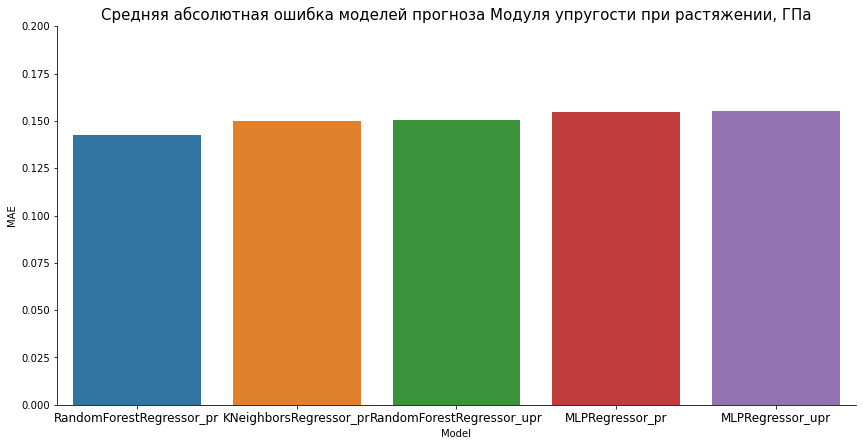

In [201]:
# Создание графика для средней абсолютной ошибки моделей прогноза параметра 'Модуля упругости при растяжении, ГПа'
sns.catplot(data=models_sort[0:5], x='Model', y='MAE', kind='bar', height=6, aspect=2)
plt.ylim(ymin=0, ymax=0.2)
plt.xticks(size=12)
plt.title('Средняя абсолютная ошибка моделей прогноза Модуля упругости при растяжении, ГПа', size=15)

Text(0.5, 1.0, 'Средняя абсолютная ошибка моделей прогноза Прочности при растяжении, МПа')

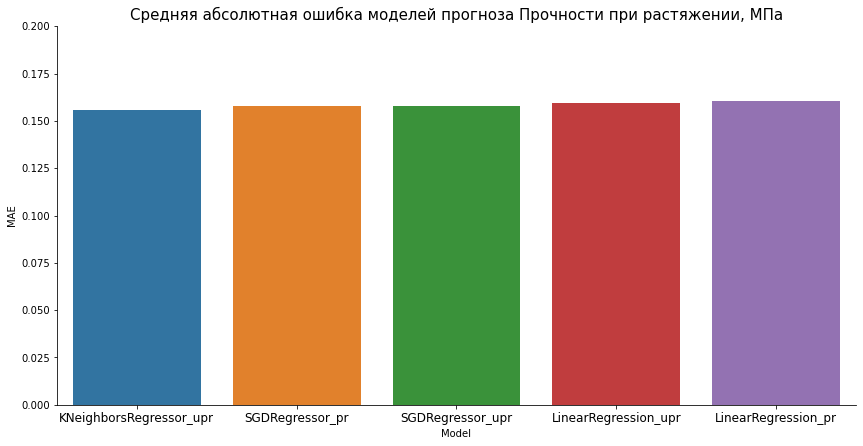

In [202]:
# Создание графика для средней абсолютной ошибки моделей прогноза параметра 'Прочности при растяжении, МПа'
sns.catplot(data=models_sort[5:10], x='Model', y='MAE', kind='bar', height=6, aspect=2)
plt.ylim(ymin=0, ymax=0.2)
plt.xticks(size=12)
plt.title('Средняя абсолютная ошибка моделей прогноза Прочности при растяжении, МПа', size=15)

Вывод: средние ошибки моделей прогноза примерно одинаковые

###### Построение нейронной сети на Keras

In [203]:
# Загрузка библиотеки tensorflow
import tensorflow as tf
# Загрузка модуля keras библиотеки tensorflow
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, LeakyReLU, Activation, Dropout, LSTM
from keras.callbacks import EarlyStopping, ModelCheckpoint
# Вывод версии библиотеки tensorflow
print(tf.__version__)

2.11.0


- Нейронная сеть для прогноза параметра Модуль упругости при растяжении

In [204]:
# Создание слоя, который выполняет нормализацию входных объектов
normalizer = tf.keras.layers.Normalization(axis=-1)

In [205]:
# Получение данных в слой
X_train_upr_norm = normalizer.adapt(np.array(X_train_upr))

In [206]:
# Вид модели - коллекция, стек слоев
model_upr = Sequential(X_train_upr_norm)
# Добавление слоев в модель
model_upr.add(Dense(128))
model_upr.add(BatchNormalization())
model_upr.add(LeakyReLU())
model_upr.add(Dense(64))
model_upr.add(BatchNormalization())
model_upr.add(LeakyReLU())
model_upr.add(Dense(64))
model_upr.add(BatchNormalization())
model_upr.add(LeakyReLU())
model_upr.add(Dense(32))
model_upr.add(BatchNormalization())
model_upr.add(LeakyReLU())
model_upr.add(Dense(32))
model_upr.add(BatchNormalization())
model_upr.add(LeakyReLU())
model_upr.add(Dense(1))
model_upr.add(Activation(activation='elu'))

In [207]:
# Определение процедуры обучения: передача SGD (Стохастический оптимизатор градиентного спуска,
# включает в себя поддержку импульса, затухания скорости обучения и импульсак Нестеровка),
# минимизация по 'mean_absolute_error'
model_upr.compile(
    optimizer=tf.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=False),
    loss='mean_absolute_error')

In [208]:
%%time
# Создание экземпляра и запуск обучения через метод fit()
history_upr = model_upr.fit(
    X_train_upr,
    y_train_upr,
    batch_size = 64,
    epochs=40,
    verbose=1,
    validation_split = 0.2
    )

Epoch 1/40
4/4 [==============================] - 2s 103ms/step - loss: 0.6152 - val_loss: 0.4463
Epoch 2/40
4/4 [==============================] - 0s 12ms/step - loss: 0.4674 - val_loss: 0.4352
Epoch 3/40
4/4 [==============================] - 0s 11ms/step - loss: 0.3950 - val_loss: 0.3666
Epoch 4/40
4/4 [==============================] - 0s 11ms/step - loss: 0.3545 - val_loss: 0.2782
Epoch 5/40
4/4 [==============================] - 0s 11ms/step - loss: 0.2315 - val_loss: 0.2186
Epoch 6/40
4/4 [==============================] - 0s 11ms/step - loss: 0.2294 - val_loss: 0.2414
Epoch 7/40
4/4 [==============================] - 0s 11ms/step - loss: 0.2328 - val_loss: 0.2676
Epoch 8/40
4/4 [==============================] - 0s 11ms/step - loss: 0.1846 - val_loss: 0.2447
Epoch 9/40
4/4 [==============================] - 0s 11ms/step - loss: 0.1860 - val_loss: 0.2084
Epoch 10/40
4/4 [==============================] - 0s 11ms/step - loss: 0.1688 - val_loss: 0.1966
Epoch 11/40
4/4 [===========

In [209]:
# Вывод архитектуры сети для upr
model_upr.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               1536      
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 batch_normalization_1 (Batc  (None, 64)               256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64)                0

In [210]:
#Функция для построения графика потерь модели на тренировочной и тестовой выборках
def model_loss_plot(model_history):
    plt.figure(figsize=(10, 5))
    plt.plot(model_history.history['loss'])
    plt.plot(model_history.history['val_loss'])
    plt.title('График потерь модели', size=12)
    plt.ylabel('Средняя абсолютная ошибка', size=12)
    plt.xlabel('Эпоха', size=12)
    plt.legend(['loss', 'val_loss'], loc='best')
    plt.show()

#Функция для построения графика оригинального и предсказанного значения у
def actual_and_predicted_plot(original_y, predicted_y):    
    plt.figure(figsize=(10,5))
    plt.title('Тестовые и прогнозные значения', size=12)
    plt.plot(original_y, color='blue', label = 'Тестовые значения')
    plt.plot(predicted_y, color='red', label = 'Прогнозные значения')
    plt.legend(loc='best')
    plt.show()

#Функция для построения точечного графика оригинального и предсказанного значения у   
def actual_and_predicted_scatter(original_y, predicted_y):
    plt.figure(figsize=(10,5))
    plt.title('Рассеяние тестовых и прогнозных значений', size=15)
    plt.scatter(original_y, predicted_y)
    plt.xlabel('Тестовые значения', size=12)
    plt.ylabel('Прогнозные значения', size=12)
    plt.show()

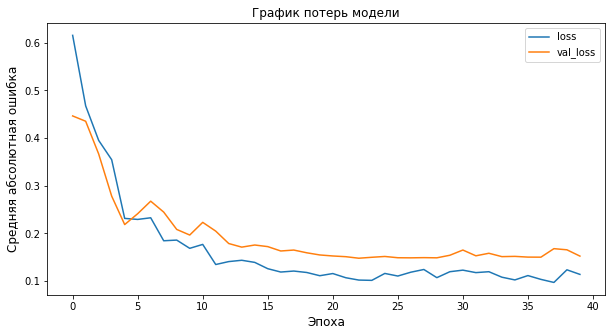

In [211]:
# Построение графика потерь модели
model_loss_plot(history_upr)

4/4 [==============================] - 0s 2ms/step


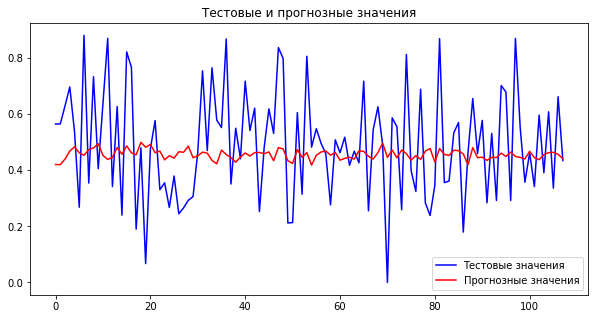

In [212]:
# Построение графика оригинального и прогнозного значения y
pred_upr = model_upr.predict(np.array((X_test_upr)))
original_upr = y_test_upr.values
predicted_upr = pred_upr

actual_and_predicted_plot(original_upr, predicted_upr)

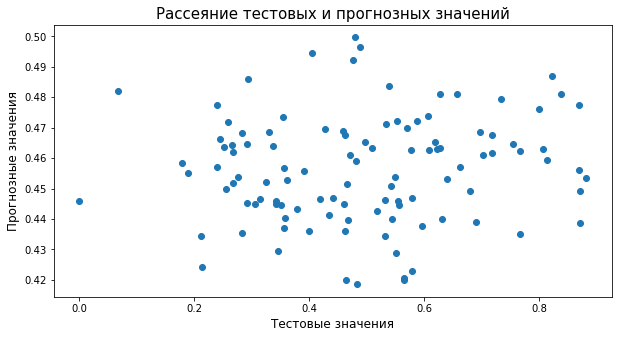

In [213]:
# Построение точечного графика рассеяния тестового и прогнозного значения y
actual_and_predicted_scatter(original_upr, predicted_upr)

In [214]:
# Вывод результата ошибки модели прогноза y
print(f'Model MAE: {model_upr.evaluate(X_test_upr, y_test_upr, verbose=1)}')

4/4 [==============================] - 0s 2ms/step - loss: 0.1592
Model MAE: 0.15924589335918427


In [215]:
# Вывод результата средней абсолютной ошибки модели прогноза y
print(f'MAE среднего значения: {np.mean(np.abs(y_test_upr-np.mean(y_test_upr)))}')

MAE среднего значения: Модуль упругости при растяжении, ГПа    0.157204
dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3438: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


- Нейронная сеть для прогноза параметра Прочность при растяжении

In [216]:
# Получение данных в слой, который выполняет нормализацию входных объектов
X_train_pr_norm = normalizer.adapt(np.array(X_train_pr))

In [217]:
# Вид модели - коллекция, стек слоев
model_pr = Sequential(X_train_pr_norm)
# Добавление слоев в модель
model_pr.add(Dense(128))
model_pr.add(BatchNormalization())
model_pr.add(LeakyReLU())
model_pr.add(Dense(64))
model_pr.add(BatchNormalization())
model_pr.add(LeakyReLU())
model_pr.add(Dense(64))
model_pr.add(BatchNormalization())
model_pr.add(LeakyReLU())
model_pr.add(Dense(32))
model_pr.add(BatchNormalization())
model_pr.add(LeakyReLU())
model_pr.add(Dense(1))
model_pr.add(Activation('selu'))

In [218]:
# Остановка обучения, когда контролируемая метрика перестает улучшаться
early_pr = EarlyStopping(monitor='val_loss', min_delta=0, patience=20, verbose=1, mode='auto')

In [219]:
# Определение процедуры обучения: передача SGD (Стохастический оптимизатор градиентного спуска,
# включает в себя поддержку импульса, затухания скорости обучения и импульсак Нестеровка),
# минимизация по 'mean_absolute_error'
model_pr.compile(
    optimizer=tf.optimizers.SGD(learning_rate=0.01),
    loss='mean_absolute_error'
    )

In [220]:
%%time
# Создание экземпляра и запуск обучения через метод fit()
history_pr = model_pr.fit(
    X_train_pr,
    y_train_pr,
    batch_size = 32,
    epochs=300,
    verbose=1,
    validation_split = 0.2,
    callbacks=[early_pr])

Epoch 1/300
7/7 [==============================] - 2s 39ms/step - loss: 0.8592 - val_loss: 0.3946
Epoch 2/300
7/7 [==============================] - 0s 7ms/step - loss: 0.6866 - val_loss: 0.3058
Epoch 3/300
7/7 [==============================] - 0s 7ms/step - loss: 0.5251 - val_loss: 0.2267
Epoch 4/300
7/7 [==============================] - 0s 6ms/step - loss: 0.4544 - val_loss: 0.2157
Epoch 5/300
7/7 [==============================] - 0s 7ms/step - loss: 0.3533 - val_loss: 0.1814
Epoch 6/300
7/7 [==============================] - 0s 6ms/step - loss: 0.3001 - val_loss: 0.1684
Epoch 7/300
7/7 [==============================] - 0s 7ms/step - loss: 0.2715 - val_loss: 0.1625
Epoch 8/300
7/7 [==============================] - 0s 7ms/step - loss: 0.2583 - val_loss: 0.1580
Epoch 9/300
7/7 [==============================] - 0s 6ms/step - loss: 0.2309 - val_loss: 0.1520
Epoch 10/300
7/7 [==============================] - 0s 7ms/step - loss: 0.2125 - val_loss: 0.1536
Epoch 11/300
7/7 [==========

In [221]:
# Вывод архитектуры сети для pr
model_pr.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 128)               1536      
                                                                 
 batch_normalization_5 (Batc  (None, 128)              512       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 64)                8256      
                                                                 
 batch_normalization_6 (Batc  (None, 64)               256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 64)               

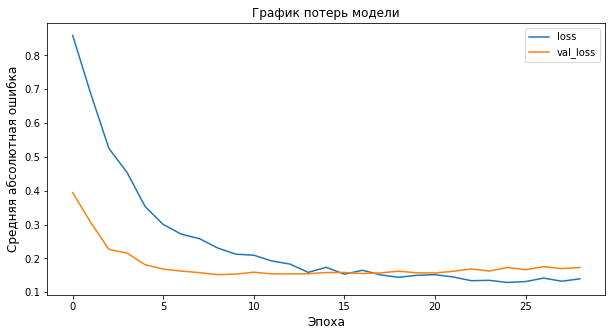

In [222]:
# Построение графика потерь модели
model_loss_plot(history_pr)

4/4 [==============================] - 0s 2ms/step


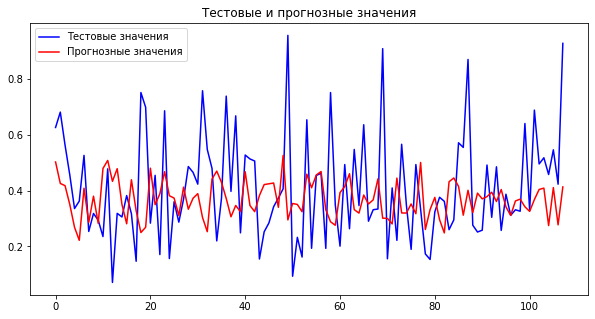

In [223]:
# Построение графика оригинального и прогнозного значения y
pred_pr = model_pr.predict(np.array((X_test_pr)))
original_pr = y_test_pr.values
predicted_pr = pred_pr

actual_and_predicted_plot(original_pr, predicted_pr)

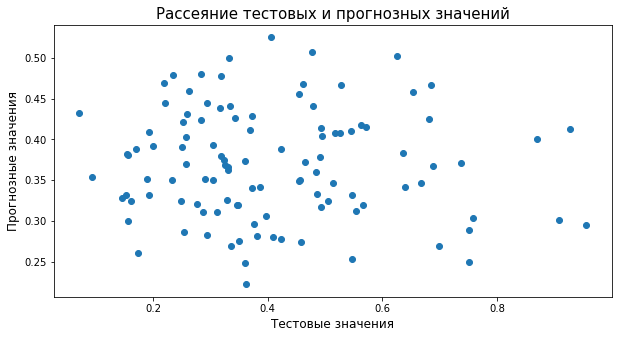

In [224]:
# Построение точечного графика рассеяния тестового и прогнозного значения y
actual_and_predicted_scatter(original_pr, predicted_pr)

In [225]:
# Вывод результата ошибки модели прогноза y
print(f'Model MAE: {model_pr.evaluate(X_test_pr, y_test_pr)}')

4/4 [==============================] - 0s 2ms/step - loss: 0.1612
Model MAE: 0.16117095947265625


In [226]:
# Вывод результата средней абсолютной ошибки модели прогноза y
print(f'MAE среднего значения: {np.mean(np.abs(y_test_pr-np.mean(y_test_pr)))}')

MAE среднего значения: Прочность при растяжении, МПа    0.151243
dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3438: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


- Нейронная сеть для предсказания параметра Соотношение матрица-наполнитель

In [227]:
# Назначение переменных для создания модели
x_mn = df.drop(['Соотношение матрица-наполнитель'], axis=1)
y_mn = df[['Соотношение матрица-наполнитель']]
# Разбиение данных на обучающую и тестовую выборки
X_train_mn, X_test_mn, y_train_mn, y_test_mn = train_test_split(x_mn, y_mn, test_size=0.3, random_state=5)

In [228]:
# Получение данных в слой, который выполняет нормализацию входных объектов
X_train_mn_norm = normalizer.adapt(np.array(X_train_mn))

In [229]:
# Вид модели - коллекция, стек слоев
model_mn = Sequential(X_train_mn_norm)
# Добавление слоев в модель
model_mn.add(Dense(128))
model_mn.add(BatchNormalization())
model_mn.add(LeakyReLU())
model_mn.add(Dense(128, activation='selu'))
model_mn.add(BatchNormalization())
model_mn.add(Dense(64, activation='selu'))
model_mn.add(BatchNormalization())
model_mn.add(Dense(32, activation='selu'))
model_mn.add(BatchNormalization())
model_mn.add(LeakyReLU())
model_mn.add(Dense(16, activation='selu'))
model_mn.add(BatchNormalization())
model_mn.add(Dense(1))
model_mn.add(Activation('selu'))

In [230]:
# Остановка обучения, когда контролируемая метрика перестает улучшаться
early_mn = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='auto')

In [231]:
# Определение процедуры обучения: передача SGD (Стохастический оптимизатор градиентного спуска,
# включает в себя поддержку импульса, затухания скорости обучения и импульсак Нестеровка),
# минимизация по 'mean_absolute_error'
model_mn.compile(
    optimizer=tf.optimizers.SGD(learning_rate=0.02, momentum=0.5),
    loss='mean_absolute_error')

In [232]:
%%time
# Создание экземпляра и запуск обучения через метод fit()
history_mn = model_mn.fit(
    X_train_mn,
    y_train_mn,
    batch_size = 64,
    epochs=100,
    verbose=1,
    validation_split = 0.2,
    callbacks = [early_mn]
    )

Epoch 1/100
4/4 [==============================] - 3s 84ms/step - loss: 1.0201 - val_loss: 0.6725
Epoch 2/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7405 - val_loss: 0.2941
Epoch 3/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5160 - val_loss: 0.2998
Epoch 4/100
4/4 [==============================] - 0s 11ms/step - loss: 0.3687 - val_loss: 0.1802
Epoch 5/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2821 - val_loss: 0.1443
Epoch 6/100
4/4 [==============================] - 0s 11ms/step - loss: 0.2373 - val_loss: 0.1858
Epoch 7/100
4/4 [==============================] - 0s 11ms/step - loss: 0.2323 - val_loss: 0.1450
Epoch 8/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1822 - val_loss: 0.1686
Epoch 9/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1607 - val_loss: 0.2665
Epoch 10/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1783 - val_loss: 0.1798
Epoch 11/100
4/4 [=

In [233]:
# Вывод архитектуры сети для mn
model_mn.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_11 (Dense)            (None, 128)               1536      
                                                                 
 batch_normalization_9 (Batc  (None, 128)              512       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_9 (LeakyReLU)   (None, 128)               0         
                                                                 
 dense_12 (Dense)            (None, 128)               16512     
                                                                 
 batch_normalization_10 (Bat  (None, 128)              512       
 chNormalization)                                                
                                                                 
 dense_13 (Dense)            (None, 64)               

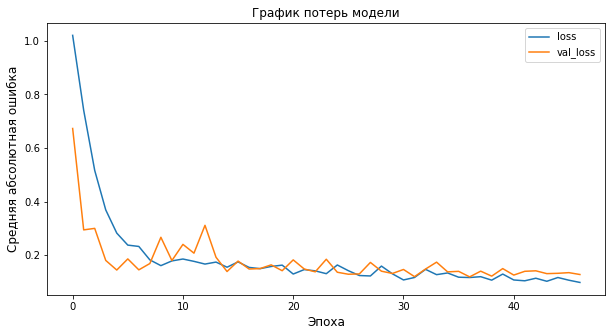

In [234]:
# Построение графика потерь модели
model_loss_plot(history_mn)

4/4 [==============================] - 0s 1ms/step


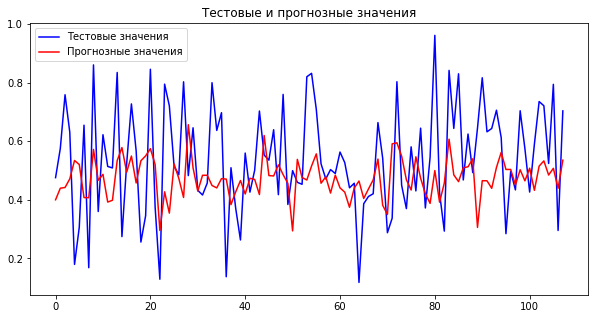

In [235]:
# Построение графика оригинального и прогнозного значения y
pred_mn = model_mn.predict(np.array((X_test_mn)))
original_mn = y_test_mn.values
predicted_mn = pred_mn

actual_and_predicted_plot(original_mn, predicted_mn)

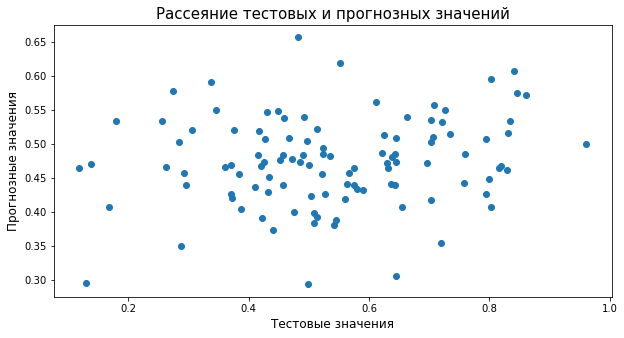

In [236]:
# Построение точечного графика рассеяния тестового и прогнозного значения y
actual_and_predicted_scatter(original_mn, predicted_mn)

In [237]:
# Вывод результата ошибки модели прогноза y
print(f'Model MAE: {model_mn.evaluate(X_test_mn, y_test_mn)}')

4/4 [==============================] - 0s 2ms/step - loss: 0.1593
Model MAE: 0.159293532371521


In [238]:
# Вывод результата средней абсолютной ошибки модели прогноза y
print(f'MAE среднего значения: {np.mean(np.abs(y_test_mn-np.mean(y_test_mn)))}')

MAE среднего значения: Соотношение матрица-наполнитель    0.147031
dtype: float64


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3438: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


Вывод: средняя абсолютная ошибка модели прогноза по рассматриваемым моделям сетей примерно в тех же границах, что и при использовании других методов